In [1]:
# ==== Block A1: imports, config, paths, seed (single GPU) ====
import os, re, glob, random, math, time
from pathlib import Path
import numpy as np
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

# --- env knobs (optional but helpful) ---
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"

# --- dataset/weights paths (your paths) ---
LQ_DIR = "/kaggle/input/enhanced-rain-dataset-v2/heavy_rain"
GT_DIR = "/kaggle/input/enhanced-rain-dataset-v2/original"
PRETRAIN_PATH = "/kaggle/input/deraining/pytorch/default/1/deraining.pth"

# --- experiment dirs ---
EXP_DIR = Path("/kaggle/working/restormer_exp")
(EXP_DIR / "checkpoints").mkdir(parents=True, exist_ok=True)
(EXP_DIR / "samples").mkdir(parents=True, exist_ok=True)

# --- minimal config (single GPU) ---
CFG = {
    "seed": 42,
    "scale": 1,
    "patch_size": 256,
    "batch": 2,               # change later if you want
    "iters_total": 30,        # as requested
    "val_every": 30,          # validate once at end
    "num_workers": 4,
    "fp16": True,             # mixed precision
    "optimizer": {"lr": 1e-4, "betas": (0.9, 0.99), "wd": 1e-4},
    "scheduler": {"warmup_iters": 500, "min_lr_ratio": 0.1},
    "extensions": (".jpg", ".jpeg"),
}

def set_seed(s):
    random.seed(s); np.random.seed(s); torch.manual_seed(s); torch.cuda.manual_seed_all(s)
set_seed(CFG["seed"])

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)
print("GPU name:", torch.cuda.get_device_name(0) if device.type=="cuda" else "CPU")

def count_images(folder, exts):
    n=0
    for e in exts: n += len(glob.glob(os.path.join(folder, f"*{e}")))
    return n

print("LQ count:", count_images(LQ_DIR, CFG["extensions"]), " | GT count:", count_images(GT_DIR, CFG["extensions"]))

# map helper: '000x_00y_heavy_var0i.jpg' -> '000x_00y.jpg'
import re
VAR_PATTERN = re.compile(r"^(?P<base>.+)_heavy_var0(?P<vid>\d)\.(?P<ext>jpg|jpeg)$", re.IGNORECASE)
def base_from_lq_name(filename: str) -> str:
    return re.sub(r"_heavy_var0\d(?=\.[^.]+$)", "", filename)


Device: cuda
GPU name: Tesla T4
LQ count: 4500  | GT count: 900


In [2]:
# ==== Block A2: Restormer arch ====
import numbers
from einops import rearrange

def to_3d(x):  return rearrange(x, 'b c h w -> b (h w) c')
def to_4d(x,h,w): return rearrange(x, 'b (h w) c -> b c h w', h=h, w=w)

class BiasFree_LayerNorm(nn.Module):
    def __init__(self, normalized_shape):
        super().__init__()
        if isinstance(normalized_shape, numbers.Integral): normalized_shape=(normalized_shape,)
        self.weight = nn.Parameter(torch.ones(torch.Size(normalized_shape)))
    def forward(self, x):
        sigma = x.var(-1, keepdim=True, unbiased=False)
        return x / torch.sqrt(sigma+1e-5) * self.weight

class WithBias_LayerNorm(nn.Module):
    def __init__(self, normalized_shape):
        super().__init__()
        if isinstance(normalized_shape, numbers.Integral): normalized_shape=(normalized_shape,)
        normalized_shape = torch.Size(normalized_shape)
        self.weight = nn.Parameter(torch.ones(normalized_shape))
        self.bias = nn.Parameter(torch.zeros(normalized_shape))
    def forward(self, x):
        mu = x.mean(-1, keepdim=True)
        sigma = x.var(-1, keepdim=True, unbiased=False)
        return (x-mu)/torch.sqrt(sigma+1e-5)*self.weight + self.bias

class LayerNorm(nn.Module):
    def __init__(self, dim, LayerNorm_type='WithBias'):
        super().__init__()
        self.body = BiasFree_LayerNorm(dim) if LayerNorm_type=='BiasFree' else WithBias_LayerNorm(dim)
    def forward(self, x):
        h,w = x.shape[-2:]
        return to_4d(self.body(to_3d(x)), h, w)

class FeedForward(nn.Module):
    def __init__(self, dim, ffn_expansion_factor=2.66, bias=False):
        super().__init__()
        hidden = int(dim*ffn_expansion_factor)
        self.project_in = nn.Conv2d(dim, hidden*2, 1, bias=bias)
        self.dwconv = nn.Conv2d(hidden*2, hidden*2, 3, 1, 1, groups=hidden*2, bias=bias)
        self.project_out = nn.Conv2d(hidden, dim, 1, bias=bias)
    def forward(self, x):
        x = self.project_in(x)
        x1,x2 = self.dwconv(x).chunk(2,1)
        x = F.gelu(x1) * x2
        return self.project_out(x)

class Attention(nn.Module):
    def __init__(self, dim, num_heads, bias=False):
        super().__init__()
        self.num_heads = num_heads
        self.temperature = nn.Parameter(torch.ones(num_heads,1,1))
        self.qkv = nn.Conv2d(dim, dim*3, 1, bias=bias)
        self.qkv_dwconv = nn.Conv2d(dim*3, dim*3, 3,1,1, groups=dim*3, bias=bias)
        self.project_out = nn.Conv2d(dim, dim, 1, bias=bias)
    def forward(self, x):
        b,c,h,w = x.shape
        qkv = self.qkv_dwconv(self.qkv(x))
        q,k,v = qkv.chunk(3,1)
        q = rearrange(q, 'b (head c) h w -> b head c (h w)', head=self.num_heads)
        k = rearrange(k, 'b (head c) h w -> b head c (h w)', head=self.num_heads)
        v = rearrange(v, 'b (head c) h w -> b head c (h w)', head=self.num_heads)
        q = F.normalize(q, dim=-1); k = F.normalize(k, dim=-1)
        attn = (q @ k.transpose(-2,-1)) * self.temperature
        attn = attn.softmax(-1)
        out = attn @ v
        out = rearrange(out, 'b head c (h w) -> b (head c) h w', head=self.num_heads, h=h, w=w)
        return self.project_out(out)

class TransformerBlock(nn.Module):
    def __init__(self, dim, num_heads, ffn_expansion_factor=2.66, bias=False, LayerNorm_type='WithBias'):
        super().__init__()
        self.norm1 = LayerNorm(dim, LayerNorm_type)
        self.attn  = Attention(dim, num_heads, bias)
        self.norm2 = LayerNorm(dim, LayerNorm_type)
        self.ffn   = FeedForward(dim, ffn_expansion_factor, bias)
    def forward(self, x):
        x = x + self.attn(self.norm1(x))
        x = x + self.ffn(self.norm2(x))
        return x

class OverlapPatchEmbed(nn.Module):
    def __init__(self, in_c=3, embed_dim=48, bias=False):
        super().__init__()
        self.proj = nn.Conv2d(in_c, embed_dim, 3,1,1, bias=bias)
    def forward(self, x): return self.proj(x)

class Downsample(nn.Module):
    def __init__(self, n_feat):
        super().__init__()
        self.body = nn.Sequential(nn.Conv2d(n_feat, n_feat//2, 3,1,1, bias=False), nn.PixelUnshuffle(2))
    def forward(self, x): return self.body(x)

class Upsample(nn.Module):
    def __init__(self, n_feat):
        super().__init__()
        self.body = nn.Sequential(nn.Conv2d(n_feat, n_feat*2, 3,1,1, bias=False), nn.PixelShuffle(2))
    def forward(self, x): return self.body(x)

class Restormer(nn.Module):
    def __init__(self, inp_channels=3, out_channels=3, dim=48,
                 num_blocks=[4,6,6,8], num_refinement_blocks=4, heads=[1,2,4,8],
                 ffn_expansion_factor=2.66, bias=False, LayerNorm_type='WithBias',
                 dual_pixel_task=False):
        super().__init__()
        self.patch_embed = OverlapPatchEmbed(inp_channels, dim)
        self.encoder_level1 = nn.Sequential(*[TransformerBlock(dim, heads[0], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[0])])
        self.down1_2 = Downsample(dim)
        self.encoder_level2 = nn.Sequential(*[TransformerBlock(int(dim*2**1), heads[1], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[1])])
        self.down2_3 = Downsample(int(dim*2**1))
        self.encoder_level3 = nn.Sequential(*[TransformerBlock(int(dim*2**2), heads[2], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[2])])
        self.down3_4 = Downsample(int(dim*2**2))
        self.latent = nn.Sequential(*[TransformerBlock(int(dim*2**3), heads[3], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[3])])
        self.up4_3 = Upsample(int(dim*2**3))
        self.reduce_chan_level3 = nn.Conv2d(int(dim*2**3), int(dim*2**2), 1, bias=bias)
        self.decoder_level3 = nn.Sequential(*[TransformerBlock(int(dim*2**2), heads[2], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[2])])
        self.up3_2 = Upsample(int(dim*2**2))
        self.reduce_chan_level2 = nn.Conv2d(int(dim*2**2), int(dim*2**1), 1, bias=bias)
        self.decoder_level2 = nn.Sequential(*[TransformerBlock(int(dim*2**1), heads[1], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[1])])
        self.up2_1 = Upsample(int(dim*2**1))
        self.decoder_level1 = nn.Sequential(*[TransformerBlock(int(dim*2**1), heads[0], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_blocks[0])])
        self.refinement = nn.Sequential(*[TransformerBlock(int(dim*2**1), heads[0], ffn_expansion_factor, bias, LayerNorm_type) for _ in range(num_refinement_blocks)])
        self.dual_pixel_task = dual_pixel_task
        if self.dual_pixel_task:
            self.skip_conv = nn.Conv2d(dim, int(dim*2**1), 1, bias=bias)
        self.output = nn.Conv2d(int(dim*2**1), out_channels, 3,1,1, bias=bias)

    def forward(self, inp_img):
        inp_enc_level1 = self.patch_embed(inp_img)
        out_enc_level1 = self.encoder_level1(inp_enc_level1)
        inp_enc_level2 = self.down1_2(out_enc_level1)
        out_enc_level2 = self.encoder_level2(inp_enc_level2)
        inp_enc_level3 = self.down2_3(out_enc_level2)
        out_enc_level3 = self.encoder_level3(inp_enc_level3)
        inp_enc_level4 = self.down3_4(out_enc_level3)
        latent = self.latent(inp_enc_level4)
        inp_dec_level3 = self.up4_3(latent)
        inp_dec_level3 = torch.cat([inp_dec_level3, out_enc_level3], 1)
        inp_dec_level3 = self.reduce_chan_level3(inp_dec_level3)
        out_dec_level3 = self.decoder_level3(inp_dec_level3)
        inp_dec_level2 = self.up3_2(out_dec_level3)
        inp_dec_level2 = torch.cat([inp_dec_level2, out_enc_level2], 1)
        inp_dec_level2 = self.reduce_chan_level2(inp_dec_level2)
        out_dec_level2 = self.decoder_level2(inp_dec_level2)
        inp_dec_level1 = self.up2_1(out_dec_level2)
        inp_dec_level1 = torch.cat([inp_dec_level1, out_enc_level1], 1)
        out_dec_level1 = self.decoder_level1(inp_dec_level1)
        out_dec_level1 = self.refinement(out_dec_level1)
        if self.dual_pixel_task:
            out_dec_level1 = out_dec_level1 + self.skip_conv(inp_enc_level1)
            out = self.output(out_dec_level1)
        else:
            out = self.output(out_dec_level1) + inp_img
        return out

def build_restormer_for_derain():
    m = Restormer(
        inp_channels=3, out_channels=3,
        dim=48, num_blocks=[4,6,6,8], num_refinement_blocks=4,
        heads=[1,2,4,8], ffn_expansion_factor=2.66,
        bias=False, LayerNorm_type='WithBias', dual_pixel_task=False
    )
    print(f"Restormer params: {sum(p.numel() for p in m.parameters())/1e6:.2f}M")
    return m


In [3]:
# ==== Block A3: split + dataset (no caching yet) ====
from collections import defaultdict

def scan_lq_files(lq_dir, exts):
    files=[]
    for e in exts: files += sorted(glob.glob(os.path.join(lq_dir, f"*{e}")))
    return files

def map_lq_to_gt(lq_path, gt_dir):
    fname = os.path.basename(lq_path)
    m = VAR_PATTERN.match(fname)
    if not m: return None
    base = m.group("base")
    for e in CFG["extensions"]:
        p = os.path.join(gt_dir, f"{base}{e}")
        if os.path.isfile(p): return p
    any_gt = glob.glob(os.path.join(gt_dir, f"{base}.*"))
    return any_gt[0] if any_gt else None

def build_splits(lq_dir, gt_dir, seed=42, holdout_for_both_val_and_test=True):
    rng = random.Random(seed)
    all_lq = scan_lq_files(lq_dir, CFG["extensions"])
    groups = defaultdict(list)
    for lq in all_lq:
        fname = os.path.basename(lq)
        m = VAR_PATTERN.match(fname)
        if not m: continue
        base = m.group("base"); vid = int(m.group("vid"))
        gt = map_lq_to_gt(lq, gt_dir)
        if gt: groups[base].append((vid,lq,gt))
    train,val,test = [],[],[]
    for base,items in groups.items():
        idxs=list(range(len(items))); rng.shuffle(idxs)
        if holdout_for_both_val_and_test:
            hold=idxs[0]
            for i,(vid,lq,gt) in enumerate(sorted(items)):
                if i==hold: val.append((lq,gt)); test.append((lq,gt))
                else: train.append((lq,gt))
        else:
            hv,ht=idxs[:2]
            for i,(vid,lq,gt) in enumerate(sorted(items)):
                if i==hv: val.append((lq,gt))
                elif i==ht: test.append((lq,gt))
                else: train.append((lq,gt))
    print(f"[Split] bases={len(groups)}  train={len(train)}  val={len(val)}  test={len(test)}")
    return {"train":train, "val":val, "test":test}

SPLITS = build_splits(LQ_DIR, GT_DIR, seed=CFG["seed"], holdout_for_both_val_and_test=True)

# basic PIL→tensor
def pil_load_rgb(path):
    img = Image.open(path)
    if img.mode!="RGB": img=img.convert("RGB")
    return img

def pil_to_tensor(img):
    arr = np.array(img, copy=True)
    return torch.from_numpy(arr).permute(2,0,1).float()/255.0

def rand_crop_coords(h,w,crop,rng):
    y0 = 0 if h==crop else rng.randint(0,h-crop)
    x0 = 0 if w==crop else rng.randint(0,w-crop)
    return y0,x0

def pad_to_min_size(img, min_side):
    w,h = img.size
    pad_h = max(0, min_side-h); pad_w = max(0, min_side-w)
    if pad_h==0 and pad_w==0: return img
    arr = np.asarray(img)
    if pad_h>0:
        top = arr[:1]; bottom = arr[-1:]
        arr = np.concatenate([top.repeat(pad_h//2+pad_h%2,0), arr, bottom.repeat(pad_h//2,0)],0)
    if pad_w>0:
        left = arr[:,:1]; right = arr[:,-1:]
        arr = np.concatenate([left.repeat(pad_w//2+pad_w%2,1), arr, right.repeat(pad_w//2,1)],1)
    return Image.fromarray(arr)

class DerainPairDataset(Dataset):
    def __init__(self, pairs, mode="train", patch_size=256, seed=42):
        self.pairs=pairs; self.mode=mode; self.patch=patch_size; self.rng=random.Random(seed)
    def __len__(self): return len(self.pairs)
    def __getitem__(self, idx):
        lq_path, gt_path = self.pairs[idx]
        lq_img = pil_load_rgb(lq_path); gt_img = pil_load_rgb(gt_path)
        if self.mode=="train":
            lq_img = pad_to_min_size(lq_img, self.patch)
            gt_img = pad_to_min_size(gt_img, self.patch)
            w,h = lq_img.size
            assert lq_img.size==gt_img.size
            y0,x0 = rand_crop_coords(h,w,self.patch,self.rng)
            lq_img = lq_img.crop((x0,y0,x0+self.patch,y0+self.patch))
            gt_img = gt_img.crop((x0,y0,x0+self.patch,y0+self.patch))
        lq = pil_to_tensor(lq_img); gt = pil_to_tensor(gt_img)
        return {"lq":lq, "gt":gt, "lq_path":lq_path, "gt_path":gt_path}

train_set = DerainPairDataset(SPLITS["train"], mode="train", patch_size=CFG["patch_size"], seed=CFG["seed"])
val_set   = DerainPairDataset(SPLITS["val"],   mode="val",   patch_size=CFG["patch_size"], seed=CFG["seed"])

print("Train/Val lens:", len(train_set), len(val_set))
tmp = DataLoader(train_set, batch_size=2, shuffle=True, num_workers=CFG["num_workers"], pin_memory=True, drop_last=True)
b = next(iter(tmp))
print("Sample batch:", b["lq"].shape, b["gt"].shape)


[Split] bases=900  train=3600  val=900  test=900
Train/Val lens: 3600 900
Sample batch: torch.Size([2, 3, 256, 256]) torch.Size([2, 3, 256, 256])


In [4]:
# ==== Block A4: Charbonnier loss + PSNR + warmup-cosine ====
class CharbonnierLoss(nn.Module):
    def __init__(self, eps=1e-3): super().__init__(); self.eps2=eps*eps
    def forward(self, x, y): return torch.sqrt((x-y)*(x-y)+self.eps2).mean()

@torch.no_grad()
def psnr_torch(pred, target, eps=1e-10):
    pred = pred.clamp(0,1); target=target.clamp(0,1)
    mse = F.mse_loss(pred, target)
    return 100.0 if mse.item()==0 else float(20.0*math.log10(1.0/math.sqrt(mse.item()+eps)))

class WarmupCosine:
    def __init__(self, optimizer, total_iters, warmup_iters=0, min_lr_ratio=0.1):
        self.opt=optimizer; self.T=max(1,int(total_iters)); self.W=max(0,int(warmup_iters))
        self.min_lr_ratio=float(min_lr_ratio); self.base=[g['lr'] for g in optimizer.param_groups]; self.i=0
    def step(self):
        self.i+=1
        for k,pg in enumerate(self.opt.param_groups):
            base=self.base[k]
            if self.i<=self.W and self.W>0:
                lr=base*self.i/self.W
            else:
                tprime=min(max(self.i-self.W,0), self.T-self.W)
                cos=0.5*(1+math.cos(math.pi*tprime/max(1,self.T-self.W)))
                lr=self.min_lr_ratio*base + (1-self.min_lr_ratio)*base*cos
            pg['lr']=lr
    def get_lr(self): return [pg['lr'] for pg in self.opt.param_groups]


In [5]:
import gc, torch
gc.collect()
torch.cuda.empty_cache()
with torch.cuda.device(0):
    torch.cuda.ipc_collect()


In [10]:
# ==== Block A6: single-GPU training (AMP), 30 iters, val on 30 images ====
# pick 30 random val indices
random.seed(CFG["seed"])
val_idxs = random.sample(range(len(val_set_cached)), 30)
val30 = torch.utils.data.Subset(val_set_cached, val_idxs)
print("Val subset:", len(val30))

# model
torch.backends.cudnn.benchmark = True
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)

# load pretrained with strict=False
sd = torch.load(PRETRAIN_PATH, map_location="cpu")
if isinstance(sd, dict) and "state_dict" in sd and isinstance(sd["state_dict"], dict):
    sd = sd["state_dict"]
missing = model.load_state_dict(sd, strict=False)
print("Loaded pretrained (strict=False).")

# data loaders
train_loader = DataLoader(
    train_set_cached, batch_size=CFG["batch"], shuffle=True,
    num_workers=CFG["num_workers"], pin_memory=True, drop_last=True, persistent_workers=True, prefetch_factor=4
)
val_loader = DataLoader(val30, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# opt / sched / loss / amp
opt = torch.optim.AdamW(model.parameters(), lr=CFG["optimizer"]["lr"],
                        betas=CFG["optimizer"]["betas"], weight_decay=CFG["optimizer"]["wd"])
sched = WarmupCosine(opt, total_iters=CFG["iters_total"], warmup_iters=min(CFG["iters_total"], CFG["scheduler"]["warmup_iters"]),
                     min_lr_ratio=CFG["scheduler"]["min_lr_ratio"])
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=CFG["fp16"])

def validate_psnr(model, vloader):
    model.eval()
    scores=[]
    with torch.no_grad():
        for b in vloader:
            lq = b["lq"].to(device, non_blocking=True)
            gt = b["gt"].to(device, non_blocking=True)
            with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
                pred = model(lq)
            scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(np.mean(scores)) if scores else 0.0

# train for iters_total (not epochs)
iters = CFG["iters_total"]; step=0
t0 = time.time()
model.train()
while step < iters:
    for batch in train_loader:
        step += 1
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        if step==1 or step%10==0:
            print(f"[{step:03d}/{iters}] loss={loss.item():.4f} lr={sched.get_lr()[0]:.6f}")

        if step>=iters: break

# validate on 30 images
psnr = validate_psnr(model, val_loader)
print(f"[VAL-30] PSNR={psnr:.3f}  | time={(time.time()-t0):.1f}s")

# save checkpoints
ckpt = {
    "iter": step,
    "state_dict": model.state_dict(),
    "optimizer": opt.state_dict(),
    "scaler": scaler.state_dict(),
    "cfg": CFG,
}
torch.save(ckpt, EXP_DIR/"checkpoints"/"latest_singlegpu.pth")
print("Saved:", EXP_DIR/"checkpoints"/"latest_singlegpu.pth")


NameError: name 'val_set_cached' is not defined

In [6]:
# ==== Block A5: build simple .pt cache (optional but faster) ====
from tqdm import tqdm

CACHE_DIR = Path("/kaggle/working/restormer_cache_single")
GT_CACHE = CACHE_DIR / "gt_all"
LQ_CACHE_TRAIN = CACHE_DIR / "lq/train"
LQ_CACHE_VAL   = CACHE_DIR / "lq/val"
for d in [GT_CACHE, LQ_CACHE_TRAIN, LQ_CACHE_VAL]: d.mkdir(parents=True, exist_ok=True)

def img_to_tensor_fp16(path: str) -> torch.Tensor:
    img = pil_load_rgb(path)
    arr = np.array(img, copy=True)
    t = torch.from_numpy(arr).permute(2,0,1).float()/255.0
    return t.half()

def save_tensor_pt(t: torch.Tensor, path: Path): path.parent.mkdir(parents=True, exist_ok=True); torch.save(t, str(path))
def load_tensor_pt(path: Path) -> torch.Tensor: return torch.load(str(path), map_location="cpu")

def cache_split(pairs, split_name):
    lq_dir = LQ_CACHE_TRAIN if split_name=="train" else LQ_CACHE_VAL
    seen_gt = set(x.stem for x in GT_CACHE.glob("*.pt"))
    print(f"[Cache] {split_name}: {len(pairs)} pairs")
    for lq_path, gt_path in tqdm(pairs, ncols=80):
        lq_name = Path(lq_path).stem
        base = Path(base_from_lq_name(Path(lq_path).name)).stem
        gt_pt = GT_CACHE / f"{base}.pt"
        if base not in seen_gt:
            save_tensor_pt(img_to_tensor_fp16(gt_path), gt_pt); seen_gt.add(base)
        lq_pt = lq_dir / f"{lq_name}.pt"
        if not lq_pt.exists():
            save_tensor_pt(img_to_tensor_fp16(lq_path), lq_pt)
    print(f"[Cache] wrote LQ->{lq_dir} ; GT->{GT_CACHE}")

# build caches (you can skip if you don't want)
cache_split(SPLITS["train"], "train")
cache_split(SPLITS["val"],   "val")

class CachedDerainPairDataset(Dataset):
    def __init__(self, pairs, split_name, patch_size=256, seed=42):
        assert split_name in ("train","val")
        self.patch=patch_size; self.rng=random.Random(seed); self.split=split_name
        self.items=[]
        for lq_path,gt_path in pairs:
            lq_name = Path(lq_path).stem
            base = Path(base_from_lq_name(Path(lq_path).name)).stem
            lq_pt = (LQ_CACHE_TRAIN if split_name=="train" else LQ_CACHE_VAL) / f"{lq_name}.pt"
            gt_pt = GT_CACHE / f"{base}.pt"
            if lq_pt.exists() and gt_pt.exists(): self.items.append((str(lq_pt), str(gt_pt)))
        assert len(self.items)>0, f"No cached items for {split_name}"
    def __len__(self): return len(self.items)
    def __getitem__(self, idx):
        lq_pt,gt_pt = self.items[idx]
        lq = load_tensor_pt(Path(lq_pt)).float()
        gt = load_tensor_pt(Path(gt_pt)).float()
        if self.split=="train":
            _,H,W = lq.shape
            if H<self.patch or W<self.patch:
                pad_h=max(0,self.patch-H); pad_w=max(0,self.patch-W)
                lq = F.pad(lq.unsqueeze(0),(0,pad_w,0,pad_h),mode="replicate").squeeze(0)
                gt = F.pad(gt.unsqueeze(0),(0,pad_w,0,pad_h),mode="replicate").squeeze(0)
                _,H,W = lq.shape
            y0 = 0 if H==self.patch else random.randint(0,H-self.patch)
            x0 = 0 if W==self.patch else random.randint(0,W-self.patch)
            lq = lq[:, y0:y0+self.patch, x0:x0+self.patch]
            gt = gt[:, y0:y0+self.patch, x0:x0+self.patch]
        return {"lq":lq, "gt":gt, "lq_pt":lq_pt, "gt_pt":gt_pt}

train_set_cached = CachedDerainPairDataset(SPLITS["train"], "train", patch_size=CFG["patch_size"], seed=CFG["seed"])
val_set_cached   = CachedDerainPairDataset(SPLITS["val"],   "val",   patch_size=CFG["patch_size"], seed=CFG["seed"])

print("Cached lens:", len(train_set_cached), len(val_set_cached))


[Cache] train: 3600 pairs


100%|███████████████████████████████████████| 3600/3600 [01:40<00:00, 35.77it/s]


[Cache] wrote LQ->/kaggle/working/restormer_cache_single/lq/train ; GT->/kaggle/working/restormer_cache_single/gt_all
[Cache] val: 900 pairs


100%|█████████████████████████████████████████| 900/900 [00:19<00:00, 45.95it/s]


[Cache] wrote LQ->/kaggle/working/restormer_cache_single/lq/val ; GT->/kaggle/working/restormer_cache_single/gt_all
Cached lens: 3600 900


Restormer params: 26.13M
Loaded pretrained (strict=False).


Train (1 epoch):   6%|▌         | 100/1800 [02:21<39:37,  1.40s/iter, loss=0.0532, lr=2.00e-05, ips=1.4]

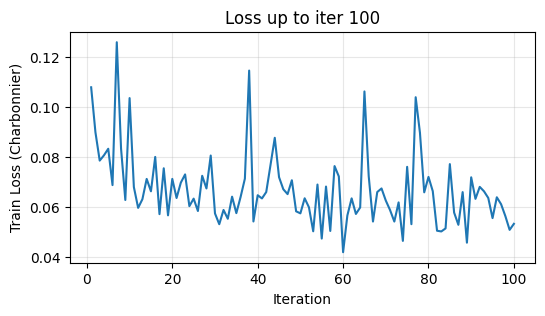

Train (1 epoch):  11%|█         | 200/1800 [04:41<37:15,  1.40s/iter, loss=0.0439, lr=4.00e-05, ips=1.4]

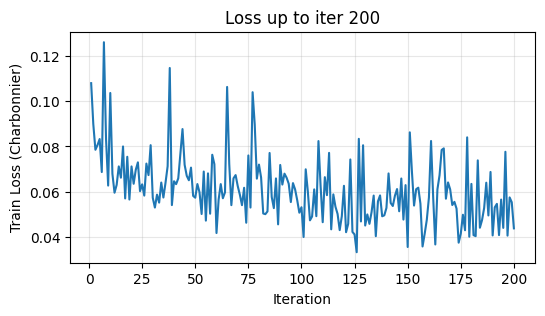

Train (1 epoch):  17%|█▋        | 300/1800 [07:00<34:39,  1.39s/iter, loss=0.0530, lr=6.00e-05, ips=1.4]

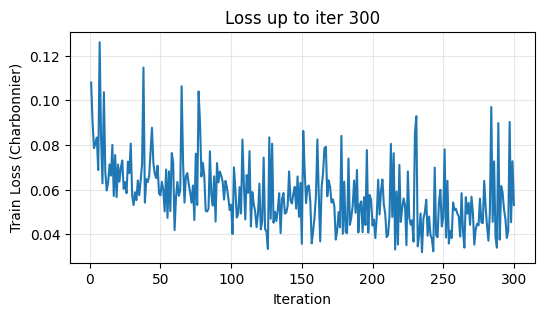

Train (1 epoch):  22%|██▏       | 400/1800 [09:20<32:38,  1.40s/iter, loss=0.0774, lr=8.00e-05, ips=1.4]

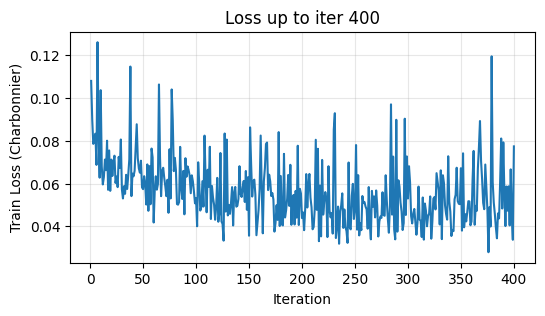

Train (1 epoch):  28%|██▊       | 500/1800 [11:39<30:08,  1.39s/iter, loss=0.0470, lr=1.00e-04, ips=1.4]

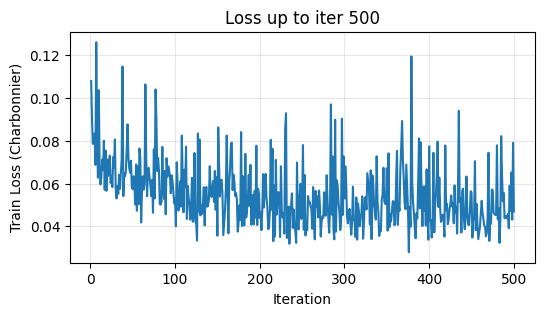

Train (1 epoch):  33%|███▎      | 600/1800 [13:58<27:51,  1.39s/iter, loss=0.0379, lr=9.87e-05, ips=1.4]

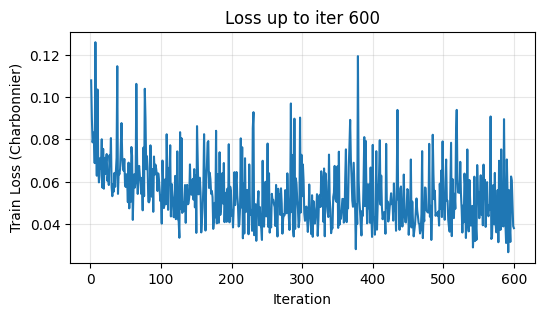

Train (1 epoch):  39%|███▉      | 700/1800 [16:18<25:42,  1.40s/iter, loss=0.0930, lr=9.48e-05, ips=1.4]

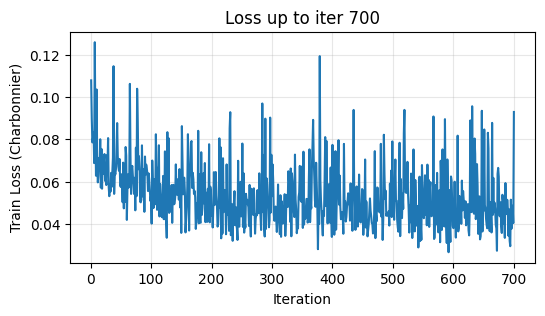

Train (1 epoch):  44%|████▍     | 800/1800 [18:38<23:15,  1.40s/iter, loss=0.0304, lr=8.87e-05, ips=1.4]

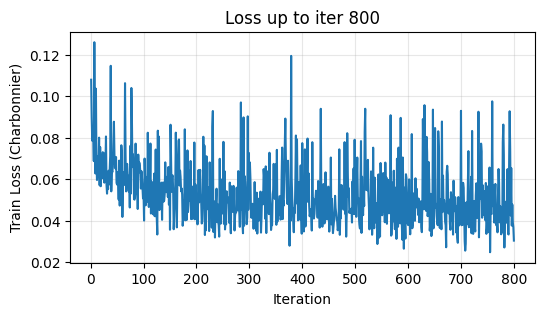

Train (1 epoch):  50%|█████     | 900/1800 [20:59<21:00,  1.40s/iter, loss=0.0403, lr=8.06e-05, ips=1.4]

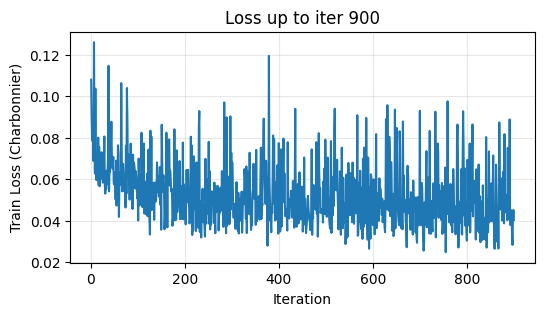

Train (1 epoch):  56%|█████▌    | 1000/1800 [23:18<18:29,  1.39s/iter, loss=0.0367, lr=7.10e-05, ips=1.4]

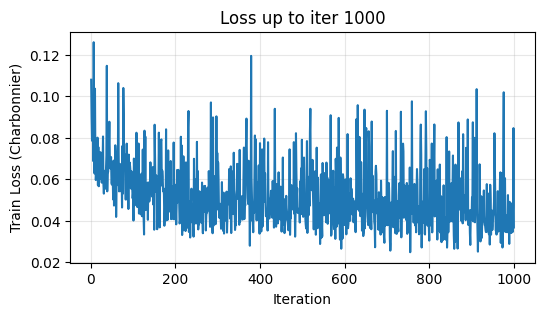

Train (1 epoch):  61%|██████    | 1100/1800 [25:37<16:21,  1.40s/iter, loss=0.0299, lr=6.04e-05, ips=1.4]

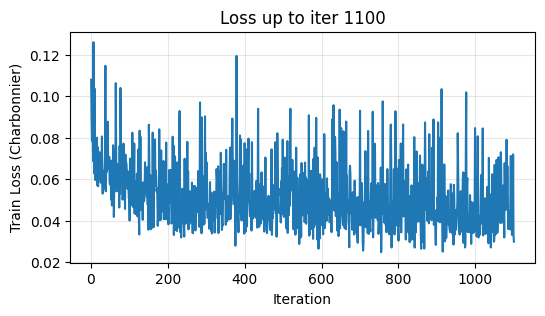

Train (1 epoch):  67%|██████▋   | 1200/1800 [27:57<13:54,  1.39s/iter, loss=0.0287, lr=4.96e-05, ips=1.4]

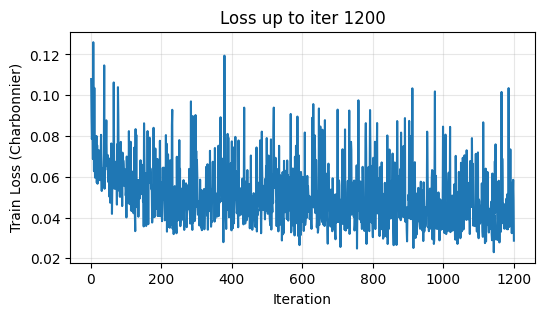

Train (1 epoch):  72%|███████▏  | 1300/1800 [30:17<11:41,  1.40s/iter, loss=0.0668, lr=3.90e-05, ips=1.4]

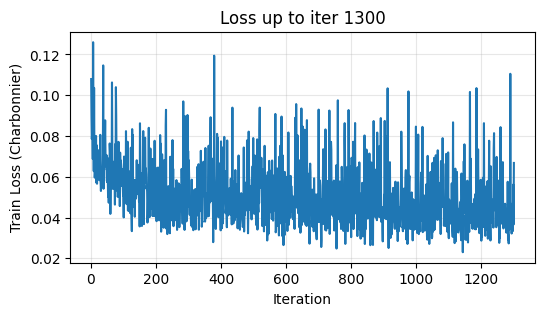

Train (1 epoch):  78%|███████▊  | 1400/1800 [32:37<09:18,  1.40s/iter, loss=0.0574, lr=2.94e-05, ips=1.4]

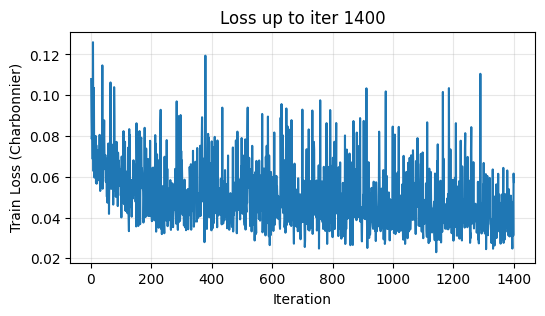

Train (1 epoch):  83%|████████▎ | 1500/1800 [34:57<06:57,  1.39s/iter, loss=0.0381, lr=2.13e-05, ips=1.4]

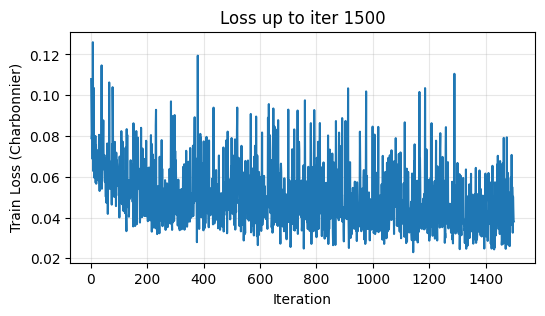

Train (1 epoch):  89%|████████▉ | 1600/1800 [37:16<04:37,  1.39s/iter, loss=0.0369, lr=1.52e-05, ips=1.4]

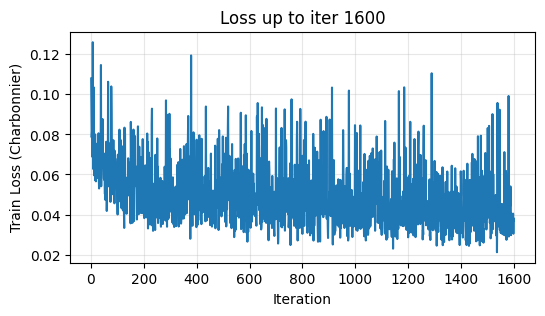

Train (1 epoch):  94%|█████████▍| 1700/1800 [39:35<02:18,  1.39s/iter, loss=0.0365, lr=1.13e-05, ips=1.5]

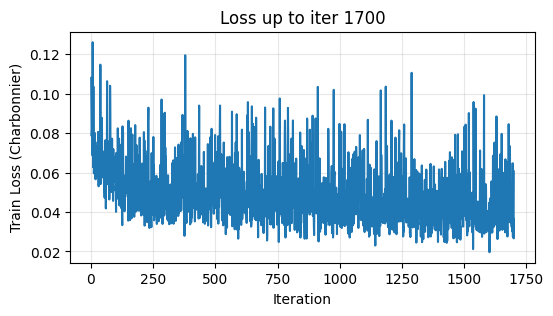

Train (1 epoch): 100%|██████████| 1800/1800 [41:54<00:00,  1.39s/iter, loss=0.0724, lr=1.00e-05, ips=1.4]

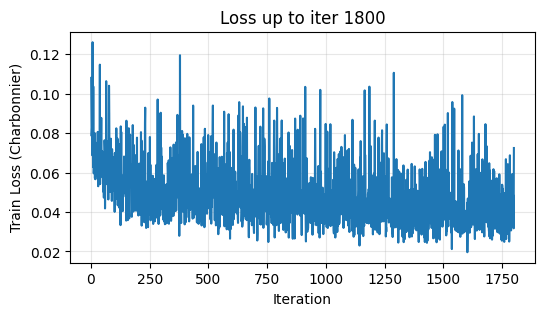

Train (1 epoch): 100%|██████████| 1800/1800 [41:54<00:00,  1.40s/iter, loss=0.0724, lr=1.00e-05, ips=1.4]


Saved checkpoint before validation -> /kaggle/working/restormer_exp/checkpoints/epoch1_before_val.pth


[VAL-100] PSNR=25.526  | total time=2594.7s


In [21]:
# ==== 1 epoch with tqdm + periodic loss curve (every 100 iters), save-before-val, val on first 100 ====
import time, math, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt

# --- loaders: 1 epoch exactly ---
assert 'train_set_cached' in globals() and 'val_set_cached' in globals(), "Run A5 first."
steps_per_epoch = len(train_set_cached) // CFG["batch"]
CFG["iters_total"] = steps_per_epoch
CFG["val_every"]   = steps_per_epoch  # validate once at end

train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)

val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# --- model ---
torch.backends.cudnn.benchmark = True
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)

# load pretrained (strict=False)
sd = torch.load(PRETRAIN_PATH, map_location="cpu")
if isinstance(sd, dict) and "state_dict" in sd and isinstance(sd["state_dict"], dict):
    sd = sd["state_dict"]
_ = model.load_state_dict(sd, strict=False)
print("Loaded pretrained (strict=False).")

# --- opt/sched/loss/amp ---
opt = torch.optim.AdamW(
    model.parameters(),
    lr=CFG["optimizer"]["lr"],
    betas=CFG["optimizer"]["betas"],
    weight_decay=CFG["optimizer"]["wd"],
)
sched = WarmupCosine(
    opt, total_iters=CFG["iters_total"],
    warmup_iters=min(CFG["iters_total"], CFG["scheduler"]["warmup_iters"]),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=CFG["fp16"])

# --- train 1 epoch with tqdm + periodic curve ---
iters = CFG["iters_total"]
loss_history = []
t0 = time.time()
model.train()

pbar = tqdm(total=iters, desc="Train (1 epoch)", unit="iter", smoothing=0.1)
iter_count = 0
for batch in train_loader:
    iter_count += 1
    bs = batch["lq"].shape[0]

    t_iter0 = time.time()
    lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
    gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

    opt.zero_grad(set_to_none=True)
    with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
        pred = model(lq)
        loss = crit(pred, gt)

    scaler.scale(loss).backward()
    scaler.step(opt)
    scaler.update()
    sched.step()

    # stats
    dt = time.time() - t_iter0
    ips = bs / dt  # images per second for this iteration (approx)
    loss_history.append((iter_count, float(loss.item())))
    pbar.set_postfix({
        "loss": f"{loss.item():.4f}",
        "lr": f"{sched.get_lr()[0]:.2e}",
        "ips": f"{ips:.1f}"
    })
    pbar.update(1)

    # plot loss every 100 iters (simple curve)
    if (iter_count % 100 == 0) or (iter_count == iters):
        steps, losses = zip(*loss_history)
        plt.figure(figsize=(6,3))
        plt.plot(steps, losses)
        plt.xlabel("Iteration")
        plt.ylabel("Train Loss (Charbonnier)")
        plt.title(f"Loss up to iter {iter_count}")
        plt.grid(True, alpha=0.3)
        plt.show()

    if iter_count >= iters:
        break

pbar.close()

# --- save checkpoint BEFORE validation ---
ckpt_path = EXP_DIR / "checkpoints" / "epoch1_before_val.pth"
torch.save({
    "iter": iter_count,
    "state_dict": model.state_dict(),
    "optimizer": opt.state_dict(),
    "scaler": scaler.state_dict(),
    "cfg": CFG,
}, ckpt_path)
print("Saved checkpoint before validation ->", ckpt_path)

# --- validate on FIRST 100 val images, show mean PSNR ---
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(np.mean(scores)) if scores else 0.0

psnr100 = validate_psnr(model, val_loader)
print(f"[VAL-100] PSNR={psnr100:.3f}  | total time={(time.time()-t0):.1f}s")


Restormer params: 26.13M

===== Starting Epoch 2 =====


Epoch 2:   6%|▌         | 100/1800 [02:20<39:30,  1.39s/iter]

[Epoch 2 | Step 00100/1800] AvgLoss=0.0457 lr=0.000028


Epoch 2:  11%|█         | 200/1800 [04:39<37:10,  1.39s/iter]

[Epoch 2 | Step 00200/1800] AvgLoss=0.0439 lr=0.000056


Epoch 2:  17%|█▋        | 300/1800 [06:59<35:02,  1.40s/iter]

[Epoch 2 | Step 00300/1800] AvgLoss=0.0441 lr=0.000083


Epoch 2:  22%|██▏       | 400/1800 [09:19<32:40,  1.40s/iter]

[Epoch 2 | Step 00400/1800] AvgLoss=0.0457 lr=0.000100


Epoch 2:  28%|██▊       | 500/1800 [11:40<30:22,  1.40s/iter]

[Epoch 2 | Step 00500/1800] AvgLoss=0.0428 lr=0.000100


Epoch 2:  33%|███▎      | 600/1800 [13:59<27:48,  1.39s/iter]

[Epoch 2 | Step 00600/1800] AvgLoss=0.0455 lr=0.000099


Epoch 2:  39%|███▉      | 700/1800 [16:20<25:41,  1.40s/iter]

[Epoch 2 | Step 00700/1800] AvgLoss=0.0442 lr=0.000098


Epoch 2:  44%|████▍     | 800/1800 [18:40<23:20,  1.40s/iter]

[Epoch 2 | Step 00800/1800] AvgLoss=0.0445 lr=0.000096


Epoch 2:  50%|█████     | 900/1800 [21:00<21:01,  1.40s/iter]

[Epoch 2 | Step 00900/1800] AvgLoss=0.0427 lr=0.000094


Epoch 2:  56%|█████▌    | 1000/1800 [23:20<18:39,  1.40s/iter]

[Epoch 2 | Step 01000/1800] AvgLoss=0.0425 lr=0.000092


Epoch 2:  61%|██████    | 1100/1800 [25:39<16:18,  1.40s/iter]

[Epoch 2 | Step 01100/1800] AvgLoss=0.0431 lr=0.000089


Epoch 2:  67%|██████▋   | 1200/1800 [27:59<13:56,  1.39s/iter]

[Epoch 2 | Step 01200/1800] AvgLoss=0.0425 lr=0.000086


Epoch 2:  72%|███████▏  | 1300/1800 [30:18<11:33,  1.39s/iter]

[Epoch 2 | Step 01300/1800] AvgLoss=0.0432 lr=0.000083


Epoch 2:  78%|███████▊  | 1400/1800 [32:37<09:20,  1.40s/iter]

[Epoch 2 | Step 01400/1800] AvgLoss=0.0409 lr=0.000079


Epoch 2:  83%|████████▎ | 1500/1800 [34:57<07:01,  1.41s/iter]

[Epoch 2 | Step 01500/1800] AvgLoss=0.0389 lr=0.000075


Epoch 2:  89%|████████▉ | 1600/1800 [37:17<04:40,  1.40s/iter]

[Epoch 2 | Step 01600/1800] AvgLoss=0.0417 lr=0.000071


Epoch 2:  94%|█████████▍| 1700/1800 [39:37<02:19,  1.40s/iter]

[Epoch 2 | Step 01700/1800] AvgLoss=0.0396 lr=0.000067


Epoch 2: 100%|██████████| 1800/1800 [41:57<00:00,  1.40s/iter]


[Epoch 2 | Step 01800/1800] AvgLoss=0.0392 lr=0.000063
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch2.pth


[VAL-100 after epoch 2] PSNR=25.981 | epoch_time=43.3 min


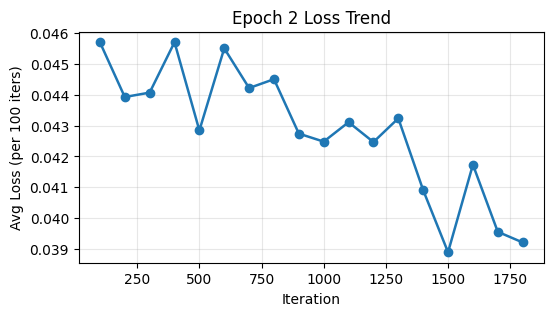


===== Starting Epoch 3 =====


Epoch 3:   6%|▌         | 100/1800 [02:19<39:21,  1.39s/iter]

[Epoch 3 | Step 00100/1800] AvgLoss=0.0377 lr=0.000058


Epoch 3:  11%|█         | 200/1800 [04:38<37:11,  1.39s/iter]

[Epoch 3 | Step 00200/1800] AvgLoss=0.0406 lr=0.000054


Epoch 3:  17%|█▋        | 300/1800 [06:57<34:48,  1.39s/iter]

[Epoch 3 | Step 00300/1800] AvgLoss=0.0398 lr=0.000050


Epoch 3:  22%|██▏       | 400/1800 [09:16<32:26,  1.39s/iter]

[Epoch 3 | Step 00400/1800] AvgLoss=0.0386 lr=0.000045


Epoch 3:  28%|██▊       | 500/1800 [11:35<30:13,  1.40s/iter]

[Epoch 3 | Step 00500/1800] AvgLoss=0.0393 lr=0.000041


Epoch 3:  33%|███▎      | 600/1800 [13:55<27:54,  1.40s/iter]

[Epoch 3 | Step 00600/1800] AvgLoss=0.0374 lr=0.000037


Epoch 3:  39%|███▉      | 700/1800 [16:14<25:38,  1.40s/iter]

[Epoch 3 | Step 00700/1800] AvgLoss=0.0382 lr=0.000033


Epoch 3:  44%|████▍     | 800/1800 [18:34<23:14,  1.39s/iter]

[Epoch 3 | Step 00800/1800] AvgLoss=0.0369 lr=0.000030


Epoch 3:  50%|█████     | 900/1800 [20:54<20:55,  1.40s/iter]

[Epoch 3 | Step 00900/1800] AvgLoss=0.0369 lr=0.000026


Epoch 3:  56%|█████▌    | 1000/1800 [23:14<18:43,  1.40s/iter]

[Epoch 3 | Step 01000/1800] AvgLoss=0.0368 lr=0.000023


Epoch 3:  61%|██████    | 1100/1800 [25:34<16:20,  1.40s/iter]

[Epoch 3 | Step 01100/1800] AvgLoss=0.0354 lr=0.000020


Epoch 3:  67%|██████▋   | 1200/1800 [27:54<13:59,  1.40s/iter]

[Epoch 3 | Step 01200/1800] AvgLoss=0.0361 lr=0.000017


Epoch 3:  72%|███████▏  | 1300/1800 [30:14<11:39,  1.40s/iter]

[Epoch 3 | Step 01300/1800] AvgLoss=0.0342 lr=0.000015


Epoch 3:  78%|███████▊  | 1400/1800 [32:33<09:20,  1.40s/iter]

[Epoch 3 | Step 01400/1800] AvgLoss=0.0352 lr=0.000013


Epoch 3:  83%|████████▎ | 1500/1800 [34:53<07:00,  1.40s/iter]

[Epoch 3 | Step 01500/1800] AvgLoss=0.0346 lr=0.000012


Epoch 3:  89%|████████▉ | 1600/1800 [37:14<04:39,  1.40s/iter]

[Epoch 3 | Step 01600/1800] AvgLoss=0.0346 lr=0.000011


Epoch 3:  94%|█████████▍| 1700/1800 [39:33<02:19,  1.40s/iter]

[Epoch 3 | Step 01700/1800] AvgLoss=0.0347 lr=0.000010


Epoch 3: 100%|██████████| 1800/1800 [41:53<00:00,  1.40s/iter]


[Epoch 3 | Step 01800/1800] AvgLoss=0.0343 lr=0.000010
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch3.pth


[VAL-100 after epoch 3] PSNR=26.977 | epoch_time=43.2 min


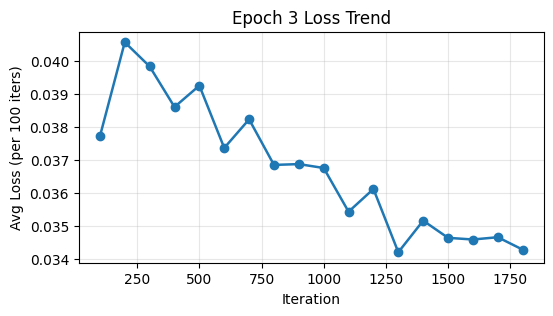

In [22]:
# ==== Continue training from epoch1 checkpoint: run for 2 more epochs, save+validate after each ====
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt

start_ckpt = "/kaggle/working/restormer_exp/checkpoints/epoch1_before_val.pth"
save_dir = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [2, 3]

# --- reload everything from checkpoint ---
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)
opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# --- loaders ---
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# --- validation function ---
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(np.mean(scores)) if scores else 0.0

# --- scheduler ---
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# --- main training ---
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)
for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / count_since_print
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # --- save checkpoint after epoch ---
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # --- validate on first 100 images ---
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # --- show loss curve for the epoch ---
    if loss_curve_x:
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


Restormer params: 26.13M

===== Starting Epoch 4 =====


Epoch 4:   6%|▌         | 100/1800 [02:20<39:39,  1.40s/iter]

[Epoch 4 | Step 00100/1800] AvgLoss=0.0346 lr=0.000020


Epoch 4:  11%|█         | 200/1800 [04:40<37:20,  1.40s/iter]

[Epoch 4 | Step 00200/1800] AvgLoss=0.0356 lr=0.000040


Epoch 4:  17%|█▋        | 300/1800 [07:00<35:01,  1.40s/iter]

[Epoch 4 | Step 00300/1800] AvgLoss=0.0362 lr=0.000060


Epoch 4:  22%|██▏       | 400/1800 [09:20<32:41,  1.40s/iter]

[Epoch 4 | Step 00400/1800] AvgLoss=0.0398 lr=0.000080


Epoch 4:  28%|██▊       | 500/1800 [11:40<30:18,  1.40s/iter]

[Epoch 4 | Step 00500/1800] AvgLoss=0.0401 lr=0.000100


Epoch 4:  33%|███▎      | 600/1800 [14:00<27:58,  1.40s/iter]

[Epoch 4 | Step 00600/1800] AvgLoss=0.0375 lr=0.000100


Epoch 4:  39%|███▉      | 700/1800 [16:20<25:42,  1.40s/iter]

[Epoch 4 | Step 00700/1800] AvgLoss=0.0410 lr=0.000100


Epoch 4:  44%|████▍     | 800/1800 [18:40<23:24,  1.40s/iter]

[Epoch 4 | Step 00800/1800] AvgLoss=0.0392 lr=0.000099


Epoch 4:  50%|█████     | 900/1800 [21:01<20:59,  1.40s/iter]

[Epoch 4 | Step 00900/1800] AvgLoss=0.0388 lr=0.000099


Epoch 4:  56%|█████▌    | 1000/1800 [23:21<18:39,  1.40s/iter]

[Epoch 4 | Step 01000/1800] AvgLoss=0.0382 lr=0.000098


Epoch 4:  61%|██████    | 1100/1800 [25:41<16:19,  1.40s/iter]

[Epoch 4 | Step 01100/1800] AvgLoss=0.0399 lr=0.000097


Epoch 4:  67%|██████▋   | 1200/1800 [28:01<14:02,  1.40s/iter]

[Epoch 4 | Step 01200/1800] AvgLoss=0.0399 lr=0.000096


Epoch 4:  72%|███████▏  | 1300/1800 [30:21<11:44,  1.41s/iter]

[Epoch 4 | Step 01300/1800] AvgLoss=0.0373 lr=0.000094


Epoch 4:  78%|███████▊  | 1400/1800 [32:42<09:23,  1.41s/iter]

[Epoch 4 | Step 01400/1800] AvgLoss=0.0366 lr=0.000093


Epoch 4:  83%|████████▎ | 1500/1800 [35:03<07:01,  1.41s/iter]

[Epoch 4 | Step 01500/1800] AvgLoss=0.0387 lr=0.000091


Epoch 4:  89%|████████▉ | 1600/1800 [37:23<04:40,  1.40s/iter]

[Epoch 4 | Step 01600/1800] AvgLoss=0.0375 lr=0.000089


Epoch 4:  94%|█████████▍| 1700/1800 [39:43<02:20,  1.40s/iter]

[Epoch 4 | Step 01700/1800] AvgLoss=0.0376 lr=0.000087


Epoch 4: 100%|██████████| 1800/1800 [42:03<00:00,  1.40s/iter]


[Epoch 4 | Step 01800/1800] AvgLoss=0.0365 lr=0.000085
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch4.pth


[VAL-100 after epoch 4] PSNR=26.313 | epoch_time=43.4 min


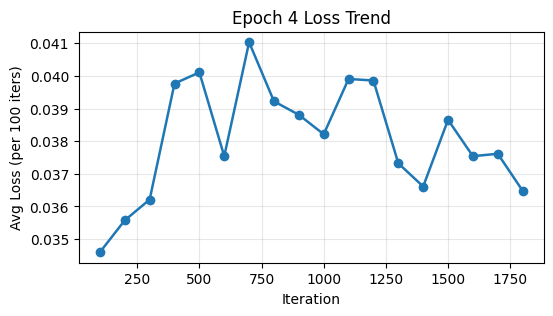


===== Starting Epoch 5 =====


Epoch 5:   6%|▌         | 100/1800 [02:20<39:47,  1.40s/iter]

[Epoch 5 | Step 00100/1800] AvgLoss=0.0358 lr=0.000083


Epoch 5:  11%|█         | 200/1800 [04:40<37:25,  1.40s/iter]

[Epoch 5 | Step 00200/1800] AvgLoss=0.0361 lr=0.000081


Epoch 5:  17%|█▋        | 300/1800 [07:00<34:56,  1.40s/iter]

[Epoch 5 | Step 00300/1800] AvgLoss=0.0363 lr=0.000078


Epoch 5:  22%|██▏       | 400/1800 [09:19<32:37,  1.40s/iter]

[Epoch 5 | Step 00400/1800] AvgLoss=0.0352 lr=0.000076


Epoch 5:  28%|██▊       | 500/1800 [11:39<30:16,  1.40s/iter]

[Epoch 5 | Step 00500/1800] AvgLoss=0.0366 lr=0.000073


Epoch 5:  33%|███▎      | 600/1800 [13:58<27:50,  1.39s/iter]

[Epoch 5 | Step 00600/1800] AvgLoss=0.0346 lr=0.000071


Epoch 5:  39%|███▉      | 700/1800 [16:17<25:27,  1.39s/iter]

[Epoch 5 | Step 00700/1800] AvgLoss=0.0352 lr=0.000068


Epoch 5:  44%|████▍     | 800/1800 [18:36<23:09,  1.39s/iter]

[Epoch 5 | Step 00800/1800] AvgLoss=0.0346 lr=0.000065


Epoch 5:  50%|█████     | 900/1800 [20:55<20:52,  1.39s/iter]

[Epoch 5 | Step 00900/1800] AvgLoss=0.0328 lr=0.000062


Epoch 5:  56%|█████▌    | 1000/1800 [23:14<18:32,  1.39s/iter]

[Epoch 5 | Step 01000/1800] AvgLoss=0.0338 lr=0.000059


Epoch 5:  61%|██████    | 1100/1800 [25:34<16:14,  1.39s/iter]

[Epoch 5 | Step 01100/1800] AvgLoss=0.0347 lr=0.000056


Epoch 5:  67%|██████▋   | 1200/1800 [27:53<13:55,  1.39s/iter]

[Epoch 5 | Step 01200/1800] AvgLoss=0.0347 lr=0.000054


Epoch 5:  72%|███████▏  | 1300/1800 [30:12<11:37,  1.40s/iter]

[Epoch 5 | Step 01300/1800] AvgLoss=0.0340 lr=0.000051


Epoch 5:  78%|███████▊  | 1400/1800 [32:31<09:16,  1.39s/iter]

[Epoch 5 | Step 01400/1800] AvgLoss=0.0337 lr=0.000048


Epoch 5:  83%|████████▎ | 1500/1800 [34:50<07:01,  1.40s/iter]

[Epoch 5 | Step 01500/1800] AvgLoss=0.0336 lr=0.000045


Epoch 5:  89%|████████▉ | 1600/1800 [37:10<04:40,  1.40s/iter]

[Epoch 5 | Step 01600/1800] AvgLoss=0.0333 lr=0.000042


Epoch 5:  94%|█████████▍| 1700/1800 [39:30<02:20,  1.40s/iter]

[Epoch 5 | Step 01700/1800] AvgLoss=0.0337 lr=0.000039


Epoch 5: 100%|██████████| 1800/1800 [41:50<00:00,  1.39s/iter]


[Epoch 5 | Step 01800/1800] AvgLoss=0.0327 lr=0.000037
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch5.pth


[VAL-100 after epoch 5] PSNR=27.405 | epoch_time=43.2 min


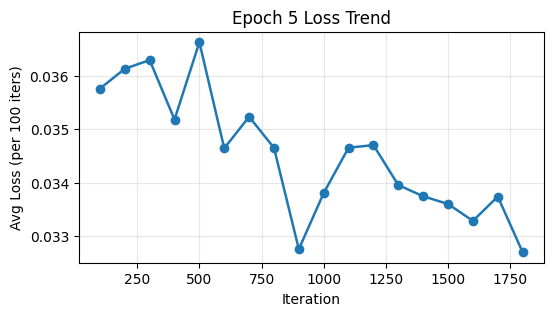


===== Starting Epoch 6 =====


Epoch 6:   6%|▌         | 100/1800 [02:20<39:39,  1.40s/iter]

[Epoch 6 | Step 00100/1800] AvgLoss=0.0322 lr=0.000034


Epoch 6:  11%|█         | 200/1800 [04:39<37:05,  1.39s/iter]

[Epoch 6 | Step 00200/1800] AvgLoss=0.0337 lr=0.000032


Epoch 6:  17%|█▋        | 300/1800 [06:58<34:51,  1.39s/iter]

[Epoch 6 | Step 00300/1800] AvgLoss=0.0314 lr=0.000029


Epoch 6:  22%|██▏       | 400/1800 [09:18<32:37,  1.40s/iter]

[Epoch 6 | Step 00400/1800] AvgLoss=0.0315 lr=0.000027


Epoch 6:  28%|██▊       | 500/1800 [11:38<30:25,  1.40s/iter]

[Epoch 6 | Step 00500/1800] AvgLoss=0.0321 lr=0.000025


Epoch 6:  33%|███▎      | 600/1800 [13:58<27:56,  1.40s/iter]

[Epoch 6 | Step 00600/1800] AvgLoss=0.0316 lr=0.000023


Epoch 6:  39%|███▉      | 700/1800 [16:18<25:38,  1.40s/iter]

[Epoch 6 | Step 00700/1800] AvgLoss=0.0315 lr=0.000021


Epoch 6:  44%|████▍     | 800/1800 [18:38<23:16,  1.40s/iter]

[Epoch 6 | Step 00800/1800] AvgLoss=0.0314 lr=0.000019


Epoch 6:  50%|█████     | 900/1800 [20:58<21:01,  1.40s/iter]

[Epoch 6 | Step 00900/1800] AvgLoss=0.0298 lr=0.000017


Epoch 6:  56%|█████▌    | 1000/1800 [23:18<18:40,  1.40s/iter]

[Epoch 6 | Step 01000/1800] AvgLoss=0.0301 lr=0.000016


Epoch 6:  61%|██████    | 1100/1800 [25:38<16:22,  1.40s/iter]

[Epoch 6 | Step 01100/1800] AvgLoss=0.0307 lr=0.000014


Epoch 6:  67%|██████▋   | 1200/1800 [27:58<14:00,  1.40s/iter]

[Epoch 6 | Step 01200/1800] AvgLoss=0.0304 lr=0.000013


Epoch 6:  72%|███████▏  | 1300/1800 [30:18<11:41,  1.40s/iter]

[Epoch 6 | Step 01300/1800] AvgLoss=0.0326 lr=0.000012


Epoch 6:  78%|███████▊  | 1400/1800 [32:38<09:19,  1.40s/iter]

[Epoch 6 | Step 01400/1800] AvgLoss=0.0306 lr=0.000011


Epoch 6:  83%|████████▎ | 1500/1800 [34:58<06:58,  1.39s/iter]

[Epoch 6 | Step 01500/1800] AvgLoss=0.0312 lr=0.000011


Epoch 6:  89%|████████▉ | 1600/1800 [37:18<04:39,  1.40s/iter]

[Epoch 6 | Step 01600/1800] AvgLoss=0.0308 lr=0.000010


Epoch 6:  94%|█████████▍| 1700/1800 [39:37<02:20,  1.41s/iter]

[Epoch 6 | Step 01700/1800] AvgLoss=0.0303 lr=0.000010


Epoch 6: 100%|██████████| 1800/1800 [41:58<00:00,  1.40s/iter]


[Epoch 6 | Step 01800/1800] AvgLoss=0.0310 lr=0.000010
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch6.pth


[VAL-100 after epoch 6] PSNR=27.905 | epoch_time=43.3 min


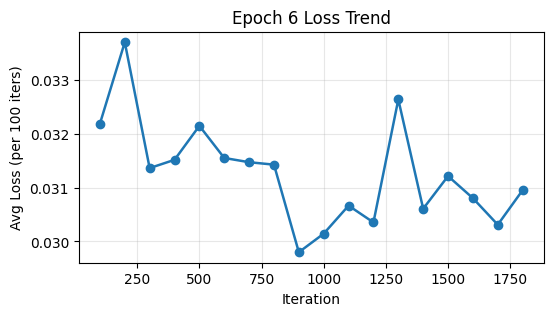

In [23]:
# ==== Continue training from epoch3 -> run epochs 4, 5, 6 with val after each ====
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt

start_ckpt = "/kaggle/working/restormer_exp/checkpoints/epoch3.pth"
save_dir = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [4, 5, 6]

# --- reload from epoch3 ---
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)
opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# --- loaders ---
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# --- validation function ---
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(np.mean(scores)) if scores else 0.0

# --- scheduler ---
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# --- main training ---
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)

for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / count_since_print
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # --- save checkpoint ---
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # --- validate on first 100 images ---
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # --- show loss curve for epoch ---
    if loss_curve_x:
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


In [25]:
!cd /kaggle/working
!zip -r restormer_checkpoints.zip restormer_exp/checkpoints


  adding: restormer_exp/checkpoints/ (stored 0%)
  adding: restormer_exp/checkpoints/epoch5.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch3.pth (deflated 8%)
  adding: restormer_exp/checkpoints/latest_singlegpu.pth (deflated 7%)
  adding: restormer_exp/checkpoints/epoch4.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch2.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch1_before_val.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch6.pth (deflated 8%)


In [29]:
# ==== Continue training from epoch6 -> run epochs 7, 8, 9, 10 with val after each ====
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt

start_ckpt = "/kaggle/working/restormer_exp/checkpoints/epoch6.pth"
save_dir = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [7, 8, 9, 10]

# --- reload from epoch6 ---
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)
opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# --- loaders (cached datasets assumed from earlier blocks) ---
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# --- validation ---
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(np.mean(scores)) if scores else 0.0

# --- scheduler for these 4 epochs ---
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# --- main training ---
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)

for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / max(1, count_since_print)
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # save checkpoint
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # validate
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # plot loss trend for the epoch
    if loss_curve_x:
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


Restormer params: 26.13M

===== Starting Epoch 7 =====


Epoch 7:   6%|▌         | 100/1800 [02:19<40:14,  1.42s/iter]

[Epoch 7 | Step 00100/1800] AvgLoss=0.0310 lr=0.000020


Epoch 7:   8%|▊         | 145/1800 [03:23<38:45,  1.41s/iter]


KeyboardInterrupt: 

In [36]:
# === Robust Kaggle Authentication (for Kaggle Models + Datasets) ===
from kaggle_secrets import UserSecretsClient
import os, json, pathlib, subprocess
from kaggle.api.kaggle_api_extended import KaggleApi

# --- 1️⃣ Fetch credentials from secrets ---
user_secrets = UserSecretsClient()
username = user_secrets.get_secret("username").strip()
key = user_secrets.get_secret("key").strip()

# --- 2️⃣ Prepare JSON config ---
cfg = {"username": username, "key": key}
cfg_json = json.dumps(cfg)

# --- 3️⃣ Write kaggle.json to both required locations ---
paths = [
    pathlib.Path("~/.kaggle").expanduser() / "kaggle.json",
    pathlib.Path("/root/.config/kaggle") / "kaggle.json",
]
for p in paths:
    p.parent.mkdir(parents=True, exist_ok=True)
    with open(p, "w") as f:
        f.write(cfg_json)
    os.chmod(p, 0o600)

# --- 4️⃣ Set environment variables for CLI ---
os.environ["KAGGLE_USERNAME"] = username
os.environ["KAGGLE_KEY"] = key

# --- 5️⃣ Ensure CLI installed ---
try:
    import kaggle  # noqa
    print("✅ Kaggle CLI already installed")
except Exception:
    subprocess.check_call(["pip", "install", "-q", "kaggle"])
    import kaggle
    print("✅ Installed Kaggle CLI")

# --- 6️⃣ Authenticate ---
api = KaggleApi()
api.authenticate()

# --- 7️⃣ Verify ---
print(f"👤 Authenticated successfully as: {username}")


✅ Kaggle CLI already installed
👤 Authenticated successfully as: dlcoderr


In [43]:
# C1 — init a Kaggle *Model* (robust username fetch, no get_user_profile)
import os, json, shutil, subprocess
from pathlib import Path
from kaggle.api.kaggle_api_extended import KaggleApi

api = KaggleApi(); api.authenticate()

def _get_kaggle_username():
    # 1) env var (we set it during auth)
    u = os.environ.get("KAGGLE_USERNAME")
    if u: return u.strip()
    # 2) ~/.kaggle/kaggle.json
    kj = Path("~/.kaggle/kaggle.json").expanduser()
    if kj.exists():
        with open(kj) as f:
            return json.load(f)["username"].strip()
    # 3) /root/.config/kaggle/kaggle.json
    kj = Path("/root/.config/kaggle/kaggle.json")
    if kj.exists():
        with open(kj) as f:
            return json.load(f)["username"].strip()
    raise RuntimeError("Could not determine Kaggle username.")

owner = _get_kaggle_username()
MODEL_SLUG = "restormer-deraining"
MODEL_ID = f"{owner}/{MODEL_SLUG}"

# staging dir for model versions (only the single .pth file goes here)
KMODEL_DIR = Path("/kaggle/working/kmodel_ckpts")
KMODEL_DIR.mkdir(parents=True, exist_ok=True)

# model metadata (only once)
meta_path = KMODEL_DIR / "model-metadata.json"
if not meta_path.exists():
    meta = {
        "id": MODEL_ID,
        "title": "Restormer — Deraining (finetuned)",
        "subtitle": "Per-epoch PyTorch checkpoints",
        "description": "Each model version contains exactly one .pth checkpoint (single-file versioning).",
        "isPrivate": True,
        "licenses": [{"name": "CC0-1.0"}],
        "framework": "pytorch"
    }
    with open(meta_path, "w") as f:
        json.dump(meta, f, indent=2)

# create model if it doesn't exist; otherwise proceed to versioning
try:
    subprocess.check_call(["kaggle", "models", "create", "-p", str(KMODEL_DIR)])
    print(f"✅ Created Kaggle Model: {MODEL_ID}")
except subprocess.CalledProcessError:
    print(f"ℹ️ Kaggle Model already exists: {MODEL_ID} — will create versions.")


Key ownerSlug not found in data
ℹ️ Kaggle Model already exists: dlcoderr/restormer-deraining — will create versions.


In [51]:
# ✅ Push a single .pth as a new Kaggle Model *instance* (version)
def kaggle_model_push_single_instance(pth_path: str, note: str):
    import json, shutil, subprocess, tempfile
    from pathlib import Path

    assert 'MODEL_ID' in globals(), "Run C1 once to set MODEL_ID."
    src = Path(pth_path)
    assert src.exists(), f"Checkpoint not found: {src}"

    # Stage the single file in a temporary instance folder
    inst_dir = Path(tempfile.mkdtemp(prefix="kmodel_inst_"))
    dst = inst_dir / src.name
    shutil.copy2(src, dst)

    # Write model-instance-metadata.json (files + notes)
    inst_meta = {
        "modelId": MODEL_ID,                    # e.g. "yourname/restormer-deraining"
        "versionNotes": note,                   # free-form note shown for the version
        "files": [{"path": dst.name}]           # only this one .pth file
    }
    with open(inst_dir / "model-instance-metadata.json", "w") as f:
        json.dump(inst_meta, f, indent=2)

    # Create the instance (new version)
    subprocess.check_call([
        "kaggle", "models", "instances", "create",
        "-p", str(inst_dir)
    ])
    print(f"✅ Pushed new model instance with file: {dst.name}  | note='{note}'")


In [52]:
kaggle_model_push_single_instance("/kaggle/working/restormer_exp/checkpoints/epoch7.pth",
                                  note="epoch 7")


Key ownerSlug not found in data


CalledProcessError: Command '['kaggle', 'models', 'instances', 'create', '-p', '/tmp/kmodel_inst_5ieg87pz']' returned non-zero exit status 1.

In [48]:
# C3 — Train epochs 7,8,9,10 starting from epoch6.pth; save, validate(100), push each epoch
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt
from pathlib import Path

# preflight
assert Path("/kaggle/working/restormer_exp/checkpoints/epoch6.pth").exists(), "Missing epoch6.pth"
needed = ["train_set_cached","val_set_cached","build_restormer_for_derain",
          "CharbonnierLoss","WarmupCosine","psnr_torch","device","CFG"]
missing = [n for n in needed if n not in globals()]
assert not missing, f"Missing defs: {missing} (rerun A1–A5)"

start_ckpt = "/kaggle/working/restormer_exp/checkpoints/epoch6.pth"
save_dir   = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

# reload
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)

opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# loaders
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# val fn
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(sum(scores)/len(scores)) if scores else 0.0

# scheduler for these 4 epochs
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# main loop
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)

for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / max(1, count_since_print)
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # save checkpoint
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # push single-file model version to Kaggle Model
    # kaggle_model_push_single(save_path, note=f"epoch {epoch}")

    # validate
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # plot loss trend
    if loss_curve_x:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


Restormer params: 26.13M

===== Starting Epoch 7 =====


Epoch 7:   6%|▌         | 100/1800 [02:20<39:46,  1.40s/iter]

[Epoch 7 | Step 00100/1800] AvgLoss=0.0320 lr=0.000020


Epoch 7:  11%|█         | 200/1800 [04:39<36:59,  1.39s/iter]

[Epoch 7 | Step 00200/1800] AvgLoss=0.0310 lr=0.000040


Epoch 7:  17%|█▋        | 300/1800 [06:58<34:50,  1.39s/iter]

[Epoch 7 | Step 00300/1800] AvgLoss=0.0317 lr=0.000060


Epoch 7:  22%|██▏       | 400/1800 [09:18<32:41,  1.40s/iter]

[Epoch 7 | Step 00400/1800] AvgLoss=0.0324 lr=0.000080


Epoch 7:  28%|██▊       | 500/1800 [11:39<30:31,  1.41s/iter]

[Epoch 7 | Step 00500/1800] AvgLoss=0.0323 lr=0.000100


Epoch 7:  33%|███▎      | 600/1800 [13:59<27:51,  1.39s/iter]

[Epoch 7 | Step 00600/1800] AvgLoss=0.0339 lr=0.000100


Epoch 7:  39%|███▉      | 700/1800 [16:19<25:41,  1.40s/iter]

[Epoch 7 | Step 00700/1800] AvgLoss=0.0348 lr=0.000100


Epoch 7:  44%|████▍     | 800/1800 [18:39<23:30,  1.41s/iter]

[Epoch 7 | Step 00800/1800] AvgLoss=0.0351 lr=0.000100


Epoch 7:  50%|█████     | 900/1800 [21:00<21:08,  1.41s/iter]

[Epoch 7 | Step 00900/1800] AvgLoss=0.0324 lr=0.000100


Epoch 7:  56%|█████▌    | 1000/1800 [23:21<18:35,  1.39s/iter]

[Epoch 7 | Step 01000/1800] AvgLoss=0.0341 lr=0.000100


Epoch 7:  61%|██████    | 1100/1800 [25:40<16:27,  1.41s/iter]

[Epoch 7 | Step 01100/1800] AvgLoss=0.0338 lr=0.000100


Epoch 7:  67%|██████▋   | 1200/1800 [28:00<13:56,  1.39s/iter]

[Epoch 7 | Step 01200/1800] AvgLoss=0.0337 lr=0.000100


Epoch 7:  72%|███████▏  | 1300/1800 [30:20<11:42,  1.41s/iter]

[Epoch 7 | Step 01300/1800] AvgLoss=0.0334 lr=0.000100


Epoch 7:  78%|███████▊  | 1400/1800 [32:40<09:15,  1.39s/iter]

[Epoch 7 | Step 01400/1800] AvgLoss=0.0320 lr=0.000100


Epoch 7:  83%|████████▎ | 1500/1800 [35:00<06:59,  1.40s/iter]

[Epoch 7 | Step 01500/1800] AvgLoss=0.0331 lr=0.000100


Epoch 7:  89%|████████▉ | 1600/1800 [37:20<04:40,  1.40s/iter]

[Epoch 7 | Step 01600/1800] AvgLoss=0.0345 lr=0.000100


Epoch 7:  94%|█████████▍| 1700/1800 [39:40<02:21,  1.41s/iter]

[Epoch 7 | Step 01700/1800] AvgLoss=0.0336 lr=0.000099


Epoch 7: 100%|██████████| 1800/1800 [42:01<00:00,  1.40s/iter]


[Epoch 7 | Step 01800/1800] AvgLoss=0.0340 lr=0.000099
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch7.pth


usage: kaggle models [-h] {instances,get,list,init,create,delete,update} ...
kaggle models: error: argument command: invalid choice: 'version' (choose from 'instances', 'get', 'list', 'init', 'create', 'delete', 'update')


CalledProcessError: Command '['kaggle', 'models', 'version', '-p', '/kaggle/working/kmodel_ckpts', '-m', 'epoch 7']' returned non-zero exit status 2.

Restormer params: 26.13M

===== Starting Epoch 8 =====


Epoch 8:   6%|▌         | 100/1800 [02:18<39:55,  1.41s/iter]

[Epoch 8 | Step 00100/1800] AvgLoss=0.0307 lr=0.000020


Epoch 8:  11%|█         | 200/1800 [04:38<37:22,  1.40s/iter]

[Epoch 8 | Step 00200/1800] AvgLoss=0.0313 lr=0.000040


Epoch 8:  17%|█▋        | 300/1800 [06:58<35:10,  1.41s/iter]

[Epoch 8 | Step 00300/1800] AvgLoss=0.0315 lr=0.000060


Epoch 8:  22%|██▏       | 400/1800 [09:18<32:36,  1.40s/iter]

[Epoch 8 | Step 00400/1800] AvgLoss=0.0333 lr=0.000080


Epoch 8:  28%|██▊       | 500/1800 [11:39<30:30,  1.41s/iter]

[Epoch 8 | Step 00500/1800] AvgLoss=0.0343 lr=0.000100


Epoch 8:  33%|███▎      | 600/1800 [13:59<27:50,  1.39s/iter]

[Epoch 8 | Step 00600/1800] AvgLoss=0.0336 lr=0.000100


Epoch 8:  39%|███▉      | 700/1800 [16:19<25:46,  1.41s/iter]

[Epoch 8 | Step 00700/1800] AvgLoss=0.0343 lr=0.000100


Epoch 8:  44%|████▍     | 800/1800 [18:39<23:17,  1.40s/iter]

[Epoch 8 | Step 00800/1800] AvgLoss=0.0342 lr=0.000100


Epoch 8:  50%|█████     | 900/1800 [20:59<21:01,  1.40s/iter]

[Epoch 8 | Step 00900/1800] AvgLoss=0.0354 lr=0.000100


Epoch 8:  56%|█████▌    | 1000/1800 [23:19<18:43,  1.40s/iter]

[Epoch 8 | Step 01000/1800] AvgLoss=0.0325 lr=0.000100


Epoch 8:  61%|██████    | 1100/1800 [25:39<16:21,  1.40s/iter]

[Epoch 8 | Step 01100/1800] AvgLoss=0.0351 lr=0.000100


Epoch 8:  67%|██████▋   | 1200/1800 [28:00<13:57,  1.40s/iter]

[Epoch 8 | Step 01200/1800] AvgLoss=0.0320 lr=0.000100


Epoch 8:  72%|███████▏  | 1300/1800 [30:19<11:38,  1.40s/iter]

[Epoch 8 | Step 01300/1800] AvgLoss=0.0350 lr=0.000100


Epoch 8:  78%|███████▊  | 1400/1800 [32:39<09:21,  1.40s/iter]

[Epoch 8 | Step 01400/1800] AvgLoss=0.0347 lr=0.000100


Epoch 8:  83%|████████▎ | 1500/1800 [34:59<06:58,  1.39s/iter]

[Epoch 8 | Step 01500/1800] AvgLoss=0.0333 lr=0.000100


Epoch 8:  89%|████████▉ | 1600/1800 [37:18<04:37,  1.39s/iter]

[Epoch 8 | Step 01600/1800] AvgLoss=0.0336 lr=0.000099


Epoch 8:  94%|█████████▍| 1700/1800 [39:37<02:19,  1.39s/iter]

[Epoch 8 | Step 01700/1800] AvgLoss=0.0327 lr=0.000099


Epoch 8: 100%|██████████| 1800/1800 [41:56<00:00,  1.40s/iter]


[Epoch 8 | Step 01800/1800] AvgLoss=0.0344 lr=0.000099
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch8.pth


[VAL-100 after epoch 8] PSNR=26.809 | epoch_time=43.3 min


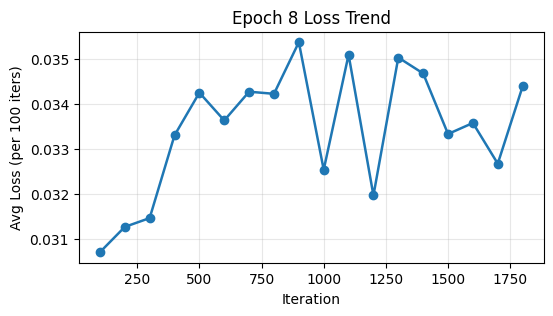


===== Starting Epoch 9 =====


Epoch 9:   6%|▌         | 100/1800 [02:19<39:25,  1.39s/iter]

[Epoch 9 | Step 00100/1800] AvgLoss=0.0351 lr=0.000099


Epoch 9:  11%|█         | 200/1800 [04:38<37:02,  1.39s/iter]

[Epoch 9 | Step 00200/1800] AvgLoss=0.0333 lr=0.000099


Epoch 9:  17%|█▋        | 300/1800 [06:57<34:56,  1.40s/iter]

[Epoch 9 | Step 00300/1800] AvgLoss=0.0344 lr=0.000099


Epoch 9:  22%|██▏       | 400/1800 [09:17<32:39,  1.40s/iter]

[Epoch 9 | Step 00400/1800] AvgLoss=0.0351 lr=0.000099


Epoch 9:  28%|██▊       | 500/1800 [11:36<30:04,  1.39s/iter]

[Epoch 9 | Step 00500/1800] AvgLoss=0.0326 lr=0.000099


Epoch 9:  33%|███▎      | 600/1800 [13:55<27:39,  1.38s/iter]

[Epoch 9 | Step 00600/1800] AvgLoss=0.0328 lr=0.000098


Epoch 9:  39%|███▉      | 700/1800 [16:15<25:39,  1.40s/iter]

[Epoch 9 | Step 00700/1800] AvgLoss=0.0335 lr=0.000098


Epoch 9:  44%|████▍     | 800/1800 [18:35<23:16,  1.40s/iter]

[Epoch 9 | Step 00800/1800] AvgLoss=0.0353 lr=0.000098


Epoch 9:  50%|█████     | 900/1800 [20:54<20:54,  1.39s/iter]

[Epoch 9 | Step 00900/1800] AvgLoss=0.0337 lr=0.000098


Epoch 9:  56%|█████▌    | 1000/1800 [23:14<18:34,  1.39s/iter]

[Epoch 9 | Step 01000/1800] AvgLoss=0.0351 lr=0.000098


Epoch 9:  61%|██████    | 1100/1800 [25:33<16:13,  1.39s/iter]

[Epoch 9 | Step 01100/1800] AvgLoss=0.0324 lr=0.000098


Epoch 9:  67%|██████▋   | 1200/1800 [27:52<13:55,  1.39s/iter]

[Epoch 9 | Step 01200/1800] AvgLoss=0.0321 lr=0.000097


Epoch 9:  72%|███████▏  | 1300/1800 [30:11<11:38,  1.40s/iter]

[Epoch 9 | Step 01300/1800] AvgLoss=0.0313 lr=0.000097


Epoch 9:  78%|███████▊  | 1400/1800 [32:31<09:17,  1.39s/iter]

[Epoch 9 | Step 01400/1800] AvgLoss=0.0317 lr=0.000097


Epoch 9:  83%|████████▎ | 1500/1800 [34:50<06:57,  1.39s/iter]

[Epoch 9 | Step 01500/1800] AvgLoss=0.0324 lr=0.000097


Epoch 9:  89%|████████▉ | 1600/1800 [37:09<04:38,  1.39s/iter]

[Epoch 9 | Step 01600/1800] AvgLoss=0.0328 lr=0.000096


Epoch 9:  94%|█████████▍| 1700/1800 [39:28<02:18,  1.39s/iter]

[Epoch 9 | Step 01700/1800] AvgLoss=0.0309 lr=0.000096


Epoch 9: 100%|██████████| 1800/1800 [41:48<00:00,  1.39s/iter]


[Epoch 9 | Step 01800/1800] AvgLoss=0.0314 lr=0.000096
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch9.pth


[VAL-100 after epoch 9] PSNR=27.812 | epoch_time=43.1 min


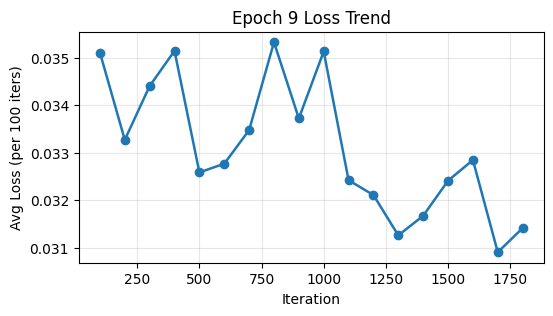


===== Starting Epoch 10 =====


Epoch 10:   6%|▌         | 100/1800 [02:19<39:26,  1.39s/iter]

[Epoch 10 | Step 00100/1800] AvgLoss=0.0333 lr=0.000096


Epoch 10:  11%|█         | 200/1800 [04:38<37:15,  1.40s/iter]

[Epoch 10 | Step 00200/1800] AvgLoss=0.0333 lr=0.000095


Epoch 10:  17%|█▋        | 300/1800 [06:58<34:54,  1.40s/iter]

[Epoch 10 | Step 00300/1800] AvgLoss=0.0323 lr=0.000095


Epoch 10:  22%|██▏       | 400/1800 [09:18<32:41,  1.40s/iter]

[Epoch 10 | Step 00400/1800] AvgLoss=0.0340 lr=0.000095


Epoch 10:  28%|██▊       | 500/1800 [11:37<30:13,  1.40s/iter]

[Epoch 10 | Step 00500/1800] AvgLoss=0.0320 lr=0.000095


Epoch 10:  33%|███▎      | 600/1800 [13:56<27:54,  1.40s/iter]

[Epoch 10 | Step 00600/1800] AvgLoss=0.0323 lr=0.000094


Epoch 10:  39%|███▉      | 700/1800 [16:16<25:30,  1.39s/iter]

[Epoch 10 | Step 00700/1800] AvgLoss=0.0314 lr=0.000094


Epoch 10:  44%|████▍     | 800/1800 [18:36<23:21,  1.40s/iter]

[Epoch 10 | Step 00800/1800] AvgLoss=0.0312 lr=0.000094


Epoch 10:  50%|█████     | 900/1800 [20:56<20:57,  1.40s/iter]

[Epoch 10 | Step 00900/1800] AvgLoss=0.0308 lr=0.000093


Epoch 10:  56%|█████▌    | 1000/1800 [23:16<19:03,  1.43s/iter]

[Epoch 10 | Step 01000/1800] AvgLoss=0.0332 lr=0.000093


Epoch 10:  61%|██████    | 1100/1800 [25:35<16:24,  1.41s/iter]

[Epoch 10 | Step 01100/1800] AvgLoss=0.0310 lr=0.000093


Epoch 10:  67%|██████▋   | 1200/1800 [27:54<13:53,  1.39s/iter]

[Epoch 10 | Step 01200/1800] AvgLoss=0.0305 lr=0.000092


Epoch 10:  72%|███████▏  | 1300/1800 [30:14<11:42,  1.41s/iter]

[Epoch 10 | Step 01300/1800] AvgLoss=0.0312 lr=0.000092


Epoch 10:  78%|███████▊  | 1400/1800 [32:34<09:16,  1.39s/iter]

[Epoch 10 | Step 01400/1800] AvgLoss=0.0316 lr=0.000092


Epoch 10:  83%|████████▎ | 1500/1800 [34:53<06:58,  1.40s/iter]

[Epoch 10 | Step 01500/1800] AvgLoss=0.0303 lr=0.000091


Epoch 10:  89%|████████▉ | 1600/1800 [37:13<04:39,  1.40s/iter]

[Epoch 10 | Step 01600/1800] AvgLoss=0.0297 lr=0.000091


Epoch 10:  94%|█████████▍| 1700/1800 [39:33<02:20,  1.40s/iter]

[Epoch 10 | Step 01700/1800] AvgLoss=0.0307 lr=0.000091


Epoch 10: 100%|██████████| 1800/1800 [41:53<00:00,  1.40s/iter]


[Epoch 10 | Step 01800/1800] AvgLoss=0.0296 lr=0.000090
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch10.pth


[VAL-100 after epoch 10] PSNR=27.930 | epoch_time=43.2 min


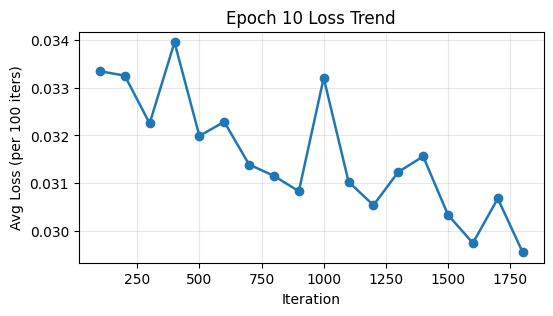


===== Starting Epoch 11 =====


Epoch 11:   6%|▌         | 100/1800 [02:20<39:47,  1.40s/iter]

[Epoch 11 | Step 00100/1800] AvgLoss=0.0326 lr=0.000090


Epoch 11:  11%|█         | 200/1800 [04:40<37:37,  1.41s/iter]

[Epoch 11 | Step 00200/1800] AvgLoss=0.0304 lr=0.000089


Epoch 11:  17%|█▋        | 300/1800 [07:00<35:14,  1.41s/iter]

[Epoch 11 | Step 00300/1800] AvgLoss=0.0294 lr=0.000089


Epoch 11:  22%|██▏       | 400/1800 [09:21<33:00,  1.41s/iter]

[Epoch 11 | Step 00400/1800] AvgLoss=0.0316 lr=0.000089


Epoch 11:  28%|██▊       | 500/1800 [11:41<30:37,  1.41s/iter]

[Epoch 11 | Step 00500/1800] AvgLoss=0.0313 lr=0.000088


Epoch 11:  33%|███▎      | 600/1800 [14:01<28:11,  1.41s/iter]

[Epoch 11 | Step 00600/1800] AvgLoss=0.0289 lr=0.000088


Epoch 11:  39%|███▉      | 700/1800 [16:22<25:45,  1.41s/iter]

[Epoch 11 | Step 00700/1800] AvgLoss=0.0328 lr=0.000087


Epoch 11:  44%|████▍     | 800/1800 [18:42<23:30,  1.41s/iter]

[Epoch 11 | Step 00800/1800] AvgLoss=0.0304 lr=0.000087


Epoch 11:  50%|█████     | 900/1800 [21:01<21:14,  1.42s/iter]

[Epoch 11 | Step 00900/1800] AvgLoss=0.0300 lr=0.000086


Epoch 11:  56%|█████▌    | 1000/1800 [23:21<18:45,  1.41s/iter]

[Epoch 11 | Step 01000/1800] AvgLoss=0.0305 lr=0.000086


Epoch 11:  61%|██████    | 1100/1800 [25:40<16:15,  1.39s/iter]

[Epoch 11 | Step 01100/1800] AvgLoss=0.0294 lr=0.000086


Epoch 11:  67%|██████▋   | 1200/1800 [28:00<13:54,  1.39s/iter]

[Epoch 11 | Step 01200/1800] AvgLoss=0.0303 lr=0.000085


Epoch 11:  72%|███████▏  | 1300/1800 [30:19<11:34,  1.39s/iter]

[Epoch 11 | Step 01300/1800] AvgLoss=0.0291 lr=0.000085


Epoch 11:  78%|███████▊  | 1400/1800 [32:39<09:17,  1.39s/iter]

[Epoch 11 | Step 01400/1800] AvgLoss=0.0292 lr=0.000084


Epoch 11:  83%|████████▎ | 1500/1800 [34:58<06:59,  1.40s/iter]

[Epoch 11 | Step 01500/1800] AvgLoss=0.0287 lr=0.000084


Epoch 11:  89%|████████▉ | 1600/1800 [37:18<04:39,  1.40s/iter]

[Epoch 11 | Step 01600/1800] AvgLoss=0.0296 lr=0.000083


Epoch 11:  94%|█████████▍| 1700/1800 [39:37<02:19,  1.39s/iter]

[Epoch 11 | Step 01700/1800] AvgLoss=0.0310 lr=0.000083


Epoch 11: 100%|██████████| 1800/1800 [41:56<00:00,  1.40s/iter]


[Epoch 11 | Step 01800/1800] AvgLoss=0.0306 lr=0.000082
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch11.pth


[VAL-100 after epoch 11] PSNR=28.322 | epoch_time=43.3 min


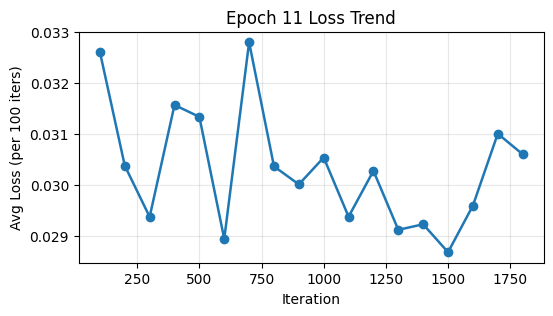


===== Starting Epoch 12 =====


Epoch 12:   6%|▌         | 100/1800 [02:19<39:28,  1.39s/iter]

[Epoch 12 | Step 00100/1800] AvgLoss=0.0300 lr=0.000082


Epoch 12:  11%|█         | 200/1800 [04:38<37:14,  1.40s/iter]

[Epoch 12 | Step 00200/1800] AvgLoss=0.0292 lr=0.000081


Epoch 12:  17%|█▋        | 300/1800 [06:58<35:03,  1.40s/iter]

[Epoch 12 | Step 00300/1800] AvgLoss=0.0284 lr=0.000081


Epoch 12:  22%|██▏       | 400/1800 [09:18<32:36,  1.40s/iter]

[Epoch 12 | Step 00400/1800] AvgLoss=0.0288 lr=0.000080


Epoch 12:  28%|██▊       | 500/1800 [11:38<30:22,  1.40s/iter]

[Epoch 12 | Step 00500/1800] AvgLoss=0.0294 lr=0.000080


Epoch 12:  33%|███▎      | 600/1800 [13:58<27:56,  1.40s/iter]

[Epoch 12 | Step 00600/1800] AvgLoss=0.0290 lr=0.000079


Epoch 12:  39%|███▉      | 700/1800 [16:17<25:36,  1.40s/iter]

[Epoch 12 | Step 00700/1800] AvgLoss=0.0287 lr=0.000079


Epoch 12:  44%|████▍     | 800/1800 [18:37<23:19,  1.40s/iter]

[Epoch 12 | Step 00800/1800] AvgLoss=0.0307 lr=0.000078


Epoch 12:  50%|█████     | 900/1800 [20:57<20:53,  1.39s/iter]

[Epoch 12 | Step 00900/1800] AvgLoss=0.0293 lr=0.000078


Epoch 12:  56%|█████▌    | 1000/1800 [23:16<18:41,  1.40s/iter]

[Epoch 12 | Step 01000/1800] AvgLoss=0.0293 lr=0.000077


Epoch 12:  61%|██████    | 1100/1800 [25:36<16:19,  1.40s/iter]

[Epoch 12 | Step 01100/1800] AvgLoss=0.0292 lr=0.000077


Epoch 12:  67%|██████▋   | 1200/1800 [27:55<13:59,  1.40s/iter]

[Epoch 12 | Step 01200/1800] AvgLoss=0.0284 lr=0.000076


Epoch 12:  72%|███████▏  | 1300/1800 [30:15<11:38,  1.40s/iter]

[Epoch 12 | Step 01300/1800] AvgLoss=0.0284 lr=0.000076


Epoch 12:  78%|███████▊  | 1400/1800 [32:35<09:16,  1.39s/iter]

[Epoch 12 | Step 01400/1800] AvgLoss=0.0286 lr=0.000075


Epoch 12:  83%|████████▎ | 1500/1800 [34:54<07:00,  1.40s/iter]

[Epoch 12 | Step 01500/1800] AvgLoss=0.0282 lr=0.000074


Epoch 12:  89%|████████▉ | 1600/1800 [37:14<04:39,  1.40s/iter]

[Epoch 12 | Step 01600/1800] AvgLoss=0.0296 lr=0.000074


Epoch 12:  94%|█████████▍| 1700/1800 [39:34<02:20,  1.40s/iter]

[Epoch 12 | Step 01700/1800] AvgLoss=0.0287 lr=0.000073


Epoch 12: 100%|██████████| 1800/1800 [41:54<00:00,  1.40s/iter]


[Epoch 12 | Step 01800/1800] AvgLoss=0.0282 lr=0.000073
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch12.pth


[VAL-100 after epoch 12] PSNR=28.450 | epoch_time=43.2 min


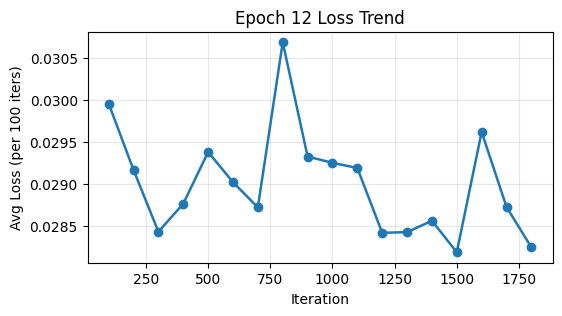


===== Starting Epoch 13 =====


Epoch 13:   6%|▌         | 100/1800 [02:19<39:37,  1.40s/iter]

[Epoch 13 | Step 00100/1800] AvgLoss=0.0275 lr=0.000072


Epoch 13:  11%|█         | 200/1800 [04:39<37:17,  1.40s/iter]

[Epoch 13 | Step 00200/1800] AvgLoss=0.0279 lr=0.000072


Epoch 13:  17%|█▋        | 300/1800 [06:59<34:56,  1.40s/iter]

[Epoch 13 | Step 00300/1800] AvgLoss=0.0293 lr=0.000071


Epoch 13:  22%|██▏       | 400/1800 [09:19<32:35,  1.40s/iter]

[Epoch 13 | Step 00400/1800] AvgLoss=0.0290 lr=0.000070


Epoch 13:  28%|██▊       | 500/1800 [11:38<30:17,  1.40s/iter]

[Epoch 13 | Step 00500/1800] AvgLoss=0.0284 lr=0.000070


Epoch 13:  33%|███▎      | 600/1800 [13:58<27:54,  1.40s/iter]

[Epoch 13 | Step 00600/1800] AvgLoss=0.0296 lr=0.000069


Epoch 13:  39%|███▉      | 700/1800 [16:18<25:37,  1.40s/iter]

[Epoch 13 | Step 00700/1800] AvgLoss=0.0277 lr=0.000069


Epoch 13:  44%|████▍     | 800/1800 [18:38<23:17,  1.40s/iter]

[Epoch 13 | Step 00800/1800] AvgLoss=0.0276 lr=0.000068


Epoch 13:  50%|█████     | 900/1800 [20:58<20:57,  1.40s/iter]

[Epoch 13 | Step 00900/1800] AvgLoss=0.0285 lr=0.000067


Epoch 13:  56%|█████▌    | 1000/1800 [23:18<18:40,  1.40s/iter]

[Epoch 13 | Step 01000/1800] AvgLoss=0.0274 lr=0.000067


Epoch 13:  61%|██████    | 1100/1800 [25:37<16:14,  1.39s/iter]

[Epoch 13 | Step 01100/1800] AvgLoss=0.0280 lr=0.000066


Epoch 13:  67%|██████▋   | 1200/1800 [27:57<14:00,  1.40s/iter]

[Epoch 13 | Step 01200/1800] AvgLoss=0.0270 lr=0.000066


Epoch 13:  72%|███████▏  | 1300/1800 [30:17<11:40,  1.40s/iter]

[Epoch 13 | Step 01300/1800] AvgLoss=0.0298 lr=0.000065


Epoch 13:  78%|███████▊  | 1400/1800 [32:37<09:19,  1.40s/iter]

[Epoch 13 | Step 01400/1800] AvgLoss=0.0282 lr=0.000064


Epoch 13:  83%|████████▎ | 1500/1800 [34:57<06:59,  1.40s/iter]

[Epoch 13 | Step 01500/1800] AvgLoss=0.0277 lr=0.000064


Epoch 13:  89%|████████▉ | 1600/1800 [37:16<04:39,  1.40s/iter]

[Epoch 13 | Step 01600/1800] AvgLoss=0.0283 lr=0.000063


Epoch 13:  94%|█████████▍| 1700/1800 [39:36<02:19,  1.39s/iter]

[Epoch 13 | Step 01700/1800] AvgLoss=0.0279 lr=0.000063


Epoch 13: 100%|██████████| 1800/1800 [41:56<00:00,  1.40s/iter]


[Epoch 13 | Step 01800/1800] AvgLoss=0.0280 lr=0.000062
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch13.pth


[VAL-100 after epoch 13] PSNR=28.258 | epoch_time=43.3 min


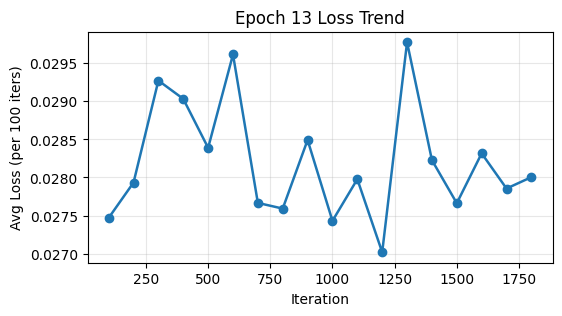


===== Starting Epoch 14 =====


Epoch 14:   6%|▌         | 100/1800 [02:20<39:38,  1.40s/iter]

[Epoch 14 | Step 00100/1800] AvgLoss=0.0284 lr=0.000061


Epoch 14:  11%|█         | 200/1800 [04:39<37:15,  1.40s/iter]

[Epoch 14 | Step 00200/1800] AvgLoss=0.0277 lr=0.000061


Epoch 14:  17%|█▋        | 300/1800 [06:59<34:55,  1.40s/iter]

[Epoch 14 | Step 00300/1800] AvgLoss=0.0281 lr=0.000060


Epoch 14:  22%|██▏       | 400/1800 [09:19<32:32,  1.39s/iter]

[Epoch 14 | Step 00400/1800] AvgLoss=0.0278 lr=0.000060


Epoch 14:  28%|██▊       | 500/1800 [11:38<30:27,  1.41s/iter]

[Epoch 14 | Step 00500/1800] AvgLoss=0.0275 lr=0.000059


Epoch 14:  33%|███▎      | 600/1800 [13:57<27:49,  1.39s/iter]

[Epoch 14 | Step 00600/1800] AvgLoss=0.0284 lr=0.000058


Epoch 14:  39%|███▉      | 700/1800 [16:17<25:35,  1.40s/iter]

[Epoch 14 | Step 00700/1800] AvgLoss=0.0276 lr=0.000058


Epoch 14:  44%|████▍     | 800/1800 [18:36<23:09,  1.39s/iter]

[Epoch 14 | Step 00800/1800] AvgLoss=0.0272 lr=0.000057


Epoch 14:  50%|█████     | 900/1800 [20:56<20:59,  1.40s/iter]

[Epoch 14 | Step 00900/1800] AvgLoss=0.0271 lr=0.000057


Epoch 14:  56%|█████▌    | 1000/1800 [23:16<18:42,  1.40s/iter]

[Epoch 14 | Step 01000/1800] AvgLoss=0.0273 lr=0.000056


Epoch 14:  61%|██████    | 1100/1800 [25:36<16:20,  1.40s/iter]

[Epoch 14 | Step 01100/1800] AvgLoss=0.0270 lr=0.000055


Epoch 14:  67%|██████▋   | 1200/1800 [27:56<13:53,  1.39s/iter]

[Epoch 14 | Step 01200/1800] AvgLoss=0.0272 lr=0.000055


Epoch 14:  72%|███████▏  | 1300/1800 [30:16<11:37,  1.39s/iter]

[Epoch 14 | Step 01300/1800] AvgLoss=0.0272 lr=0.000054


Epoch 14:  78%|███████▊  | 1400/1800 [32:35<09:17,  1.39s/iter]

[Epoch 14 | Step 01400/1800] AvgLoss=0.0268 lr=0.000053


Epoch 14:  83%|████████▎ | 1500/1800 [34:54<06:59,  1.40s/iter]

[Epoch 14 | Step 01500/1800] AvgLoss=0.0266 lr=0.000053


Epoch 14:  86%|████████▋ | 1555/1800 [36:11<05:42,  1.40s/iter]

In [ ]:
# C3 — Train epochs 7,8,9,10 starting from epoch6.pth; save, validate(100), push each epoch
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt
from pathlib import Path

# preflight
assert Path("/kaggle/working/restormer_exp/checkpoints/epoch6.pth").exists(), "Missing epoch6.pth"
needed = ["train_set_cached","val_set_cached","build_restormer_for_derain",
          "CharbonnierLoss","WarmupCosine","psnr_torch","device","CFG"]
missing = [n for n in needed if n not in globals()]
assert not missing, f"Missing defs: {missing} (rerun A1–A5)"

start_ckpt = "/kaggle/working/restormer_exp/checkpoints/epoch6.pth"
save_dir   = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

# reload
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)

opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# loaders
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# val fn
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(sum(scores)/len(scores)) if scores else 0.0

# scheduler for these 4 epochs
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# main loop
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)

for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / max(1, count_since_print)
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # save checkpoint
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # push single-file model version to Kaggle Model
    # kaggle_model_push_single(save_path, note=f"epoch {epoch}")

    # validate
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # plot loss trend
    if loss_curve_x:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


Restormer params: 26.13M

===== Starting Epoch 7 =====


Epoch 7:   6%|▌         | 100/1800 [02:29<35:34,  1.26s/iter] 

[Epoch 7 | Step 00100/1800] AvgLoss=0.0321 lr=0.000020


Epoch 7:  11%|█         | 200/1800 [04:36<33:53,  1.27s/iter]

[Epoch 7 | Step 00200/1800] AvgLoss=0.0311 lr=0.000040


Epoch 7:  17%|█▋        | 300/1800 [06:43<31:45,  1.27s/iter]

[Epoch 7 | Step 00300/1800] AvgLoss=0.0304 lr=0.000060


Epoch 7:  22%|██▏       | 400/1800 [08:50<29:40,  1.27s/iter]

[Epoch 7 | Step 00400/1800] AvgLoss=0.0327 lr=0.000080


Epoch 7:  28%|██▊       | 500/1800 [10:57<27:32,  1.27s/iter]

[Epoch 7 | Step 00500/1800] AvgLoss=0.0339 lr=0.000100


Epoch 7:  33%|███▎      | 600/1800 [13:05<25:26,  1.27s/iter]

[Epoch 7 | Step 00600/1800] AvgLoss=0.0339 lr=0.000100


Epoch 7:  39%|███▉      | 700/1800 [15:12<23:18,  1.27s/iter]

[Epoch 7 | Step 00700/1800] AvgLoss=0.0349 lr=0.000100


Epoch 7:  44%|████▍     | 800/1800 [17:19<21:14,  1.27s/iter]

[Epoch 7 | Step 00800/1800] AvgLoss=0.0337 lr=0.000100


Epoch 7:  50%|█████     | 900/1800 [19:26<19:04,  1.27s/iter]

[Epoch 7 | Step 00900/1800] AvgLoss=0.0332 lr=0.000100


Epoch 7:  56%|█████▌    | 1000/1800 [21:33<16:56,  1.27s/iter]

[Epoch 7 | Step 01000/1800] AvgLoss=0.0339 lr=0.000099


Epoch 7:  61%|██████    | 1100/1800 [23:40<14:51,  1.27s/iter]

[Epoch 7 | Step 01100/1800] AvgLoss=0.0343 lr=0.000099


Epoch 7:  67%|██████▋   | 1200/1800 [25:48<12:44,  1.27s/iter]

[Epoch 7 | Step 01200/1800] AvgLoss=0.0345 lr=0.000099


Epoch 7:  72%|███████▏  | 1300/1800 [27:55<10:36,  1.27s/iter]

[Epoch 7 | Step 01300/1800] AvgLoss=0.0347 lr=0.000098


Epoch 7:  78%|███████▊  | 1400/1800 [30:02<08:28,  1.27s/iter]

[Epoch 7 | Step 01400/1800] AvgLoss=0.0332 lr=0.000098


Epoch 7:  83%|████████▎ | 1500/1800 [32:09<06:20,  1.27s/iter]

[Epoch 7 | Step 01500/1800] AvgLoss=0.0341 lr=0.000097


Epoch 7:  89%|████████▉ | 1600/1800 [34:16<04:14,  1.27s/iter]

[Epoch 7 | Step 01600/1800] AvgLoss=0.0335 lr=0.000096


Epoch 7:  94%|█████████▍| 1700/1800 [36:24<02:07,  1.27s/iter]

[Epoch 7 | Step 01700/1800] AvgLoss=0.0353 lr=0.000096


Epoch 7: 100%|██████████| 1800/1800 [38:31<00:00,  1.28s/iter]


[Epoch 7 | Step 01800/1800] AvgLoss=0.0335 lr=0.000095
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch7.pth


[VAL-100 after epoch 7] PSNR=27.321 | epoch_time=40.0 min


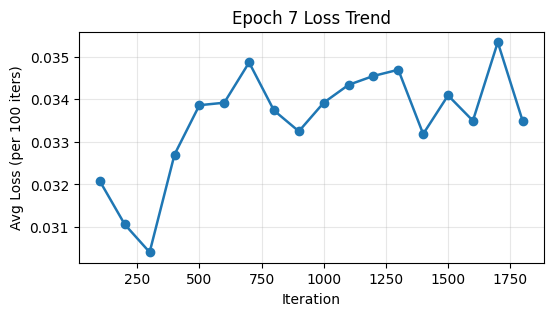


===== Starting Epoch 9 =====


Epoch 9:   6%|▌         | 100/1800 [02:07<36:05,  1.27s/iter]

[Epoch 9 | Step 00100/1800] AvgLoss=0.0326 lr=0.000094


Epoch 9:  11%|█         | 200/1800 [04:14<33:59,  1.27s/iter]

[Epoch 9 | Step 00200/1800] AvgLoss=0.0321 lr=0.000093


Epoch 9:  17%|█▋        | 300/1800 [06:22<31:52,  1.27s/iter]

[Epoch 9 | Step 00300/1800] AvgLoss=0.0311 lr=0.000092


Epoch 9:  22%|██▏       | 400/1800 [08:29<29:44,  1.27s/iter]

[Epoch 9 | Step 00400/1800] AvgLoss=0.0336 lr=0.000091


Epoch 9:  28%|██▊       | 500/1800 [10:36<27:37,  1.27s/iter]

[Epoch 9 | Step 00500/1800] AvgLoss=0.0338 lr=0.000090


Epoch 9:  33%|███▎      | 600/1800 [12:44<25:28,  1.27s/iter]

[Epoch 9 | Step 00600/1800] AvgLoss=0.0321 lr=0.000089


Epoch 9:  39%|███▉      | 700/1800 [14:51<23:21,  1.27s/iter]

[Epoch 9 | Step 00700/1800] AvgLoss=0.0342 lr=0.000088


Epoch 9:  44%|████▍     | 800/1800 [16:58<21:13,  1.27s/iter]

[Epoch 9 | Step 00800/1800] AvgLoss=0.0332 lr=0.000087


Epoch 9:  50%|█████     | 900/1800 [19:06<19:04,  1.27s/iter]

[Epoch 9 | Step 00900/1800] AvgLoss=0.0325 lr=0.000086


Epoch 9:  56%|█████▌    | 1000/1800 [21:13<16:59,  1.27s/iter]

[Epoch 9 | Step 01000/1800] AvgLoss=0.0324 lr=0.000085


Epoch 9:  61%|██████    | 1100/1800 [23:20<14:51,  1.27s/iter]

[Epoch 9 | Step 01100/1800] AvgLoss=0.0327 lr=0.000083


Epoch 9:  67%|██████▋   | 1200/1800 [25:27<12:44,  1.27s/iter]

[Epoch 9 | Step 01200/1800] AvgLoss=0.0318 lr=0.000082


Epoch 9:  72%|███████▏  | 1300/1800 [27:35<10:37,  1.27s/iter]

[Epoch 9 | Step 01300/1800] AvgLoss=0.0313 lr=0.000081


Epoch 9:  78%|███████▊  | 1400/1800 [29:42<08:31,  1.28s/iter]

[Epoch 9 | Step 01400/1800] AvgLoss=0.0321 lr=0.000079


Epoch 9:  83%|████████▎ | 1500/1800 [31:49<06:22,  1.28s/iter]

[Epoch 9 | Step 01500/1800] AvgLoss=0.0326 lr=0.000078


Epoch 9:  89%|████████▉ | 1600/1800 [33:57<04:14,  1.27s/iter]

[Epoch 9 | Step 01600/1800] AvgLoss=0.0319 lr=0.000077


Epoch 9:  94%|█████████▍| 1700/1800 [36:04<02:06,  1.27s/iter]

[Epoch 9 | Step 01700/1800] AvgLoss=0.0304 lr=0.000075


Epoch 9: 100%|██████████| 1800/1800 [38:11<00:00,  1.27s/iter]


[Epoch 9 | Step 01800/1800] AvgLoss=0.0318 lr=0.000074
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch9.pth


[VAL-100 after epoch 9] PSNR=27.923 | epoch_time=39.4 min


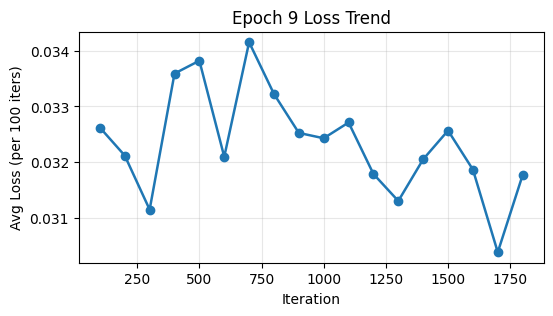


===== Starting Epoch 10 =====


Epoch 10:   6%|▌         | 100/1800 [02:07<36:07,  1.28s/iter]

[Epoch 10 | Step 00100/1800] AvgLoss=0.0324 lr=0.000072


Epoch 10:  11%|█         | 200/1800 [04:14<33:56,  1.27s/iter]

[Epoch 10 | Step 00200/1800] AvgLoss=0.0318 lr=0.000070


Epoch 10:  17%|█▋        | 300/1800 [06:21<31:46,  1.27s/iter]

[Epoch 10 | Step 00300/1800] AvgLoss=0.0307 lr=0.000069


Epoch 10:  22%|██▏       | 400/1800 [08:29<29:42,  1.27s/iter]

[Epoch 10 | Step 00400/1800] AvgLoss=0.0303 lr=0.000067


Epoch 10:  28%|██▊       | 500/1800 [10:36<27:37,  1.27s/iter]

[Epoch 10 | Step 00500/1800] AvgLoss=0.0285 lr=0.000066


Epoch 10:  33%|███▎      | 600/1800 [12:43<25:26,  1.27s/iter]

[Epoch 10 | Step 00600/1800] AvgLoss=0.0307 lr=0.000064


Epoch 10:  39%|███▉      | 700/1800 [14:50<23:14,  1.27s/iter]

[Epoch 10 | Step 00700/1800] AvgLoss=0.0297 lr=0.000062


Epoch 10:  44%|████▍     | 800/1800 [16:57<21:15,  1.28s/iter]

[Epoch 10 | Step 00800/1800] AvgLoss=0.0304 lr=0.000061


Epoch 10:  50%|█████     | 900/1800 [19:05<19:07,  1.28s/iter]

[Epoch 10 | Step 00900/1800] AvgLoss=0.0310 lr=0.000059


Epoch 10:  56%|█████▌    | 1000/1800 [21:12<16:59,  1.27s/iter]

[Epoch 10 | Step 01000/1800] AvgLoss=0.0295 lr=0.000057


Epoch 10:  61%|██████    | 1100/1800 [23:19<14:50,  1.27s/iter]

[Epoch 10 | Step 01100/1800] AvgLoss=0.0312 lr=0.000056


Epoch 10:  67%|██████▋   | 1200/1800 [25:26<12:44,  1.27s/iter]

[Epoch 10 | Step 01200/1800] AvgLoss=0.0298 lr=0.000054


Epoch 10:  72%|███████▏  | 1300/1800 [27:34<10:35,  1.27s/iter]

[Epoch 10 | Step 01300/1800] AvgLoss=0.0308 lr=0.000053


Epoch 10:  78%|███████▊  | 1400/1800 [29:41<08:29,  1.27s/iter]

[Epoch 10 | Step 01400/1800] AvgLoss=0.0311 lr=0.000051


Epoch 10:  83%|████████▎ | 1500/1800 [31:48<06:21,  1.27s/iter]

[Epoch 10 | Step 01500/1800] AvgLoss=0.0315 lr=0.000049


Epoch 10:  89%|████████▉ | 1600/1800 [33:55<04:14,  1.27s/iter]

[Epoch 10 | Step 01600/1800] AvgLoss=0.0285 lr=0.000048


Epoch 10:  94%|█████████▍| 1700/1800 [36:02<02:07,  1.27s/iter]

[Epoch 10 | Step 01700/1800] AvgLoss=0.0297 lr=0.000046


Epoch 10: 100%|██████████| 1800/1800 [38:09<00:00,  1.27s/iter]


[Epoch 10 | Step 01800/1800] AvgLoss=0.0298 lr=0.000044
✅ Saved checkpoint: /kaggle/working/restormer_exp/checkpoints/epoch10.pth


[VAL-100 after epoch 10] PSNR=28.183 | epoch_time=39.4 min


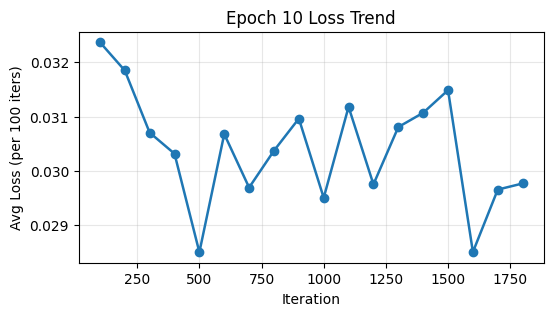


===== Starting Epoch 11 =====


Epoch 11:   2%|▏         | 42/1800 [00:53<37:25,  1.28s/iter]


KeyboardInterrupt: 

In [12]:
# C3 — Train epochs 7,8,9,10 starting from epoch6.pth; save, validate(100), push each epoch
import time, torch
from torch.utils.data import DataLoader, Subset
from tqdm import tqdm
import matplotlib.pyplot as plt
from pathlib import Path

# preflight
assert Path("/kaggle/input/epoch6/pytorch/default/1/epoch6.pth").exists(), "Missing epoch6.pth"
needed = ["train_set_cached","val_set_cached","build_restormer_for_derain",
          "CharbonnierLoss","WarmupCosine","psnr_torch","device","CFG"]
missing = [n for n in needed if n not in globals()]
assert not missing, f"Missing defs: {missing} (rerun A1–A5)"

start_ckpt = "/kaggle/input/epoch6/pytorch/default/1/epoch6.pth"
save_dir   = "/kaggle/working/restormer_exp/checkpoints"
epochs_to_run = [7, 9, 10, 11, 12]

# reload
ckpt = torch.load(start_ckpt, map_location="cpu")
model = build_restormer_for_derain().to(device).to(memory_format=torch.channels_last)
model.load_state_dict(ckpt["state_dict"], strict=False)

opt = torch.optim.AdamW(
    model.parameters(),
    lr=ckpt["cfg"]["optimizer"]["lr"],
    betas=tuple(ckpt["cfg"]["optimizer"]["betas"]),
    weight_decay=ckpt["cfg"]["optimizer"]["wd"],
)
crit = CharbonnierLoss().to(device)
scaler = torch.amp.GradScaler('cuda', enabled=ckpt["cfg"]["fp16"])
scaler.load_state_dict(ckpt["scaler"])
CFG = ckpt["cfg"]

# loaders
train_loader = DataLoader(
    train_set_cached,
    batch_size=CFG["batch"],
    shuffle=True,
    num_workers=CFG["num_workers"],
    pin_memory=True,
    drop_last=True,
    persistent_workers=True,
    prefetch_factor=4,
)
val_first100 = Subset(val_set_cached, list(range(100)))
val_loader = DataLoader(val_first100, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

# val fn
@torch.no_grad()
def validate_psnr(model, loader):
    model.eval()
    scores = []
    for b in tqdm(loader, desc="Validate (100 imgs)", unit="img", leave=False):
        lq = b["lq"].to(device, non_blocking=True)
        gt = b["gt"].to(device, non_blocking=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
        scores.append(psnr_torch(pred.float(), gt.float()))
    model.train()
    return float(sum(scores)/len(scores)) if scores else 0.0

# scheduler for these 4 epochs
sched = WarmupCosine(
    opt,
    total_iters=len(train_loader) * len(epochs_to_run),
    warmup_iters=min(500, len(train_loader)*len(epochs_to_run)//10),
    min_lr_ratio=CFG["scheduler"]["min_lr_ratio"],
)

# main loop
torch.backends.cudnn.benchmark = True
model.train()
total_iters = len(train_loader)

for epoch in epochs_to_run:
    print(f"\n===== Starting Epoch {epoch} =====")
    running_loss, count_since_print = 0.0, 0
    loss_curve_x, loss_curve_y = [], []
    t0 = time.time()

    pbar = tqdm(enumerate(train_loader, start=1), total=total_iters, unit="iter", desc=f"Epoch {epoch}")
    for step, batch in pbar:
        lq = batch["lq"].to(device, non_blocking=True).to(memory_format=torch.channels_last)
        gt = batch["gt"].to(device, non_blocking=True).to(memory_format=torch.channels_last)

        opt.zero_grad(set_to_none=True)
        with torch.amp.autocast('cuda', enabled=CFG["fp16"]):
            pred = model(lq)
            loss = crit(pred, gt)

        scaler.scale(loss).backward()
        scaler.step(opt)
        scaler.update()
        sched.step()

        running_loss += float(loss.item())
        count_since_print += 1

        if step % 100 == 0 or step == total_iters:
            avg_loss = running_loss / max(1, count_since_print)
            loss_curve_x.append(step)
            loss_curve_y.append(avg_loss)
            pbar.write(f"[Epoch {epoch} | Step {step:05d}/{total_iters}] AvgLoss={avg_loss:.4f} lr={sched.get_lr()[0]:.6f}")
            running_loss, count_since_print = 0.0, 0

    pbar.close()

    # save checkpoint
    save_path = f"{save_dir}/epoch{epoch}.pth"
    torch.save({
        "epoch": epoch,
        "state_dict": model.state_dict(),
        "optimizer": opt.state_dict(),
        "scaler": scaler.state_dict(),
        "cfg": CFG
    }, save_path)
    print(f"✅ Saved checkpoint: {save_path}")

    # push single-file model version to Kaggle Model
    # kaggle_model_push_single(save_path, note=f"epoch {epoch}")

    # validate
    psnr100 = validate_psnr(model, val_loader)
    print(f"[VAL-100 after epoch {epoch}] PSNR={psnr100:.3f} | epoch_time={(time.time()-t0)/60:.1f} min")

    # plot loss trend
    if loss_curve_x:
        import matplotlib.pyplot as plt
        plt.figure(figsize=(6,3))
        plt.plot(loss_curve_x, loss_curve_y, marker="o", lw=1.8)
        plt.xlabel("Iteration")
        plt.ylabel("Avg Loss (per 100 iters)")
        plt.title(f"Epoch {epoch} Loss Trend")
        plt.grid(alpha=0.3)
        plt.show()


In [13]:
!cd /kaggle/working && \
zip -r restormer_epochs7to13.zip \
restormer_exp/checkpoints/epoch7.pth \
restormer_exp/checkpoints/epoch8.pth \
restormer_exp/checkpoints/epoch9.pth \
restormer_exp/checkpoints/epoch10.pth 


	zip warning: name not matched: restormer_exp/checkpoints/epoch8.pth
  adding: restormer_exp/checkpoints/epoch7.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch9.pth (deflated 8%)
  adding: restormer_exp/checkpoints/epoch10.pth (deflated 8%)


In [15]:
# ---------- robust state dict loader ----------
def load_pretrained_into(model, ckpt_path, strict=False, device=None):
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")
    obj = torch.load(ckpt_path, map_location=device)
    if isinstance(obj, dict):
        for key in ["params", "state_dict", "model", "net", "ema", "params_ema"]:
            if key in obj and isinstance(obj[key], dict):
                obj = obj[key]
                break
    msg = model.load_state_dict(obj, strict=strict)
    print(f"Loaded weights from {ckpt_path} | strict={strict} | "
          f"missing={len(msg.missing_keys)}, unexpected={len(msg.unexpected_keys)}")
    return model


In [31]:
# --- Minimal helpers (run once) ---
import math, time, gc, pandas as pd, torch, torch.nn.functional as F
from pathlib import Path

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# If these were defined earlier, you can remove duplicates safely
@torch.no_grad()
def psnr_torch(pred, target, eps=1e-10):
    pred = pred.clamp(0,1); target = target.clamp(0,1)
    mse = F.mse_loss(pred, target)
    return 100.0 if mse.item()==0 else float(20*math.log10(1.0/math.sqrt(mse.item()+eps)))

@torch.no_grad()
def ssim_torch(img1, img2, window_size=11, C1=0.01**2, C2=0.03**2):
    ch = img1.size(1)
    gauss = torch.tensor(
        [math.exp(-(x - window_size//2)**2/float(2*1.5**2)) for x in range(window_size)],
        device=img1.device, dtype=img1.dtype
    )
    window = (gauss/gauss.sum()).unsqueeze(0)
    window2d = (window.T @ window).expand(ch,1,window_size,window_size)
    mu1 = F.conv2d(img1, window2d, padding=window_size//2, groups=ch)
    mu2 = F.conv2d(img2, window2d, padding=window_size//2, groups=ch)
    mu1_sq, mu2_sq, mu1_mu2 = mu1*mu1, mu2*mu2, mu1*mu2
    sigma1_sq = F.conv2d(img1*img1, window2d, padding=window_size//2, groups=ch) - mu1_sq
    sigma2_sq = F.conv2d(img2*img2, window2d, padding=window_size//2, groups=ch) - mu2_sq
    sigma12   = F.conv2d(img1*img2, window2d, padding=window_size//2, groups=ch) - mu1_mu2
    ssim_map  = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq+mu2_sq+C1)*(sigma1_sq+sigma2_sq+C2))
    return float(ssim_map.mean().item())

def load_pretrained_into(model, ckpt_path, strict=False, maploc=None):
    maploc = maploc or device
    obj = torch.load(ckpt_path, map_location=maploc)
    if isinstance(obj, dict):
        for k in ["state_dict","model","net","params","ema","params_ema"]:
            if k in obj and isinstance(obj[k], dict):
                obj = obj[k]; break
    msg = model.load_state_dict(obj, strict=strict)
    print(f"Loaded: {Path(ckpt_path).name} | strict={strict} | "
          f"missing={len(msg.missing_keys)} unexpected={len(msg.unexpected_keys)}")
    return model

from tqdm import tqdm
import gc, time, pandas as pd, torch, torch.nn.functional as F
from pathlib import Path
@torch.no_grad()
def eval_one_model_cached(ckpt_path: str, tag: str, out_csv: str):
    """
    Evaluates one checkpoint on cached validation set.
    Shows tqdm progress bar with ETA and writes metrics to CSV.
    """
    assert "val_set_cached" in globals(), "val_set_cached not found — build it first."

    model = build_restormer_for_derain().to(device).eval()
    load_pretrained_into(model, ckpt_path, strict=False)

    rows = []
    t0 = time.time()
    torch.cuda.empty_cache(); gc.collect()

    pbar = tqdm(val_set_cached, total=len(val_set_cached), ncols=100, desc=f"{tag} Eval")
    for i, batch in enumerate(pbar, 1):
        lq = batch["lq"].unsqueeze(0).to(device, non_blocking=True)
        gt = batch["gt"].unsqueeze(0).to(device, non_blocking=True)

        with torch.amp.autocast("cuda", enabled=True):
            pred = model(lq).clamp(0,1)

        psnr = psnr_torch(pred, gt)
        ssim = ssim_torch(pred, gt)

        rows.append({
            "filename": Path(batch.get("lq_pt", f"img_{i}")).stem,
            f"PSNR ({tag})": psnr,
            f"SSIM ({tag})": ssim
        })

        pbar.set_postfix({
            "PSNR": f"{psnr:.2f}",
            "SSIM": f"{ssim:.3f}"
        })

        # memory cleanup
        del lq, gt, pred
        if i % 25 == 0:
            torch.cuda.empty_cache()

    pbar.close()
    df = pd.DataFrame(rows)
    df.to_csv(out_csv, index=False)
    print(f"✅ {tag}: {len(df)} images | saved -> {out_csv} | time={time.time()-t0:.1f}s")

    del model
    torch.cuda.empty_cache(); gc.collect()
    return df

        

In [37]:
import torch, gc

def clean_gpu():
    gc.collect()
    torch.cuda.empty_cache()
    torch.cuda.ipc_collect()

clean_gpu()
print("✅ GPU memory cleaned")


✅ GPU memory cleaned


In [35]:
PRETRAIN_PATH = "/kaggle/input/deraining/pytorch/default/1/deraining.pth"
CSV_PRE = "/kaggle/working/metrics_pretrained.csv"

df_pre = eval_one_model_cached(PRETRAIN_PATH, tag="Original", out_csv=CSV_PRE)
df_pre.head()


Restormer params: 26.13M
Loaded: deraining.pth | strict=False | missing=0 unexpected=0


Original Eval: 100%|██████████████████████| 900/900 [06:56<00:00,  2.16it/s, PSNR=22.02, SSIM=0.714]


✅ Original: 900 images | saved -> /kaggle/working/metrics_pretrained.csv | time=416.9s


,filename,PSNR (Original),SSIM (Original)
0,0001_000_heavy_var04,20.637270,0.644062
1,0002_001_heavy_var04,22.948168,0.727312
2,0003_002_heavy_var04,23.825226,0.925874
3,0004_003_heavy_var02,23.526924,0.776166
4,0005_004_heavy_var05,26.938694,0.957052


In [38]:
FINETUNE_PATH = "/kaggle/working/restormer_exp/checkpoints/epoch10.pth"
CSV_OURS = "/kaggle/working/metrics_epoch10.csv"

df_ours = eval_one_model_cached(FINETUNE_PATH, tag="Ours", out_csv=CSV_OURS)
df_ours.head()


Restormer params: 26.13M
Loaded: epoch10.pth | strict=False | missing=0 unexpected=0


Ours Eval: 100%|██████████████████████████| 900/900 [07:00<00:00,  2.14it/s, PSNR=29.35, SSIM=0.877]


✅ Ours: 900 images | saved -> /kaggle/working/metrics_epoch10.csv | time=421.0s


,filename,PSNR (Ours),SSIM (Ours)
0,0001_000_heavy_var04,26.689662,0.809821
1,0002_001_heavy_var04,27.341958,0.873848
2,0003_002_heavy_var04,25.172492,0.939060
3,0004_003_heavy_var02,28.431318,0.915093
4,0005_004_heavy_var05,29.588828,0.962320


In [39]:
import pandas as pd

CSV_FINAL = "/kaggle/working/val_cached_psnr_ssim_comparison.csv"

pre = pd.read_csv(CSV_PRE)
our = pd.read_csv(CSV_OURS)
df = pre.merge(our, on="filename", how="inner")

# Optional: sort by improvement
if {"PSNR (Original)","PSNR (Ours)"} <= set(df.columns):
    df["ΔPSNR"] = df["PSNR (Ours)"] - df["PSNR (Original)"]
    df = df.sort_values("ΔPSNR", ascending=False)

df.to_csv(CSV_FINAL, index=False)
print(f"📄 Final saved -> {CSV_FINAL}  | rows={len(df)}")
df.head(10)


📄 Final saved -> /kaggle/working/val_cached_psnr_ssim_comparison.csv  | rows=900


,filename,PSNR (Original),SSIM (Original),PSNR (Ours),SSIM (Ours),ΔPSNR
842,0843_842_heavy_var02,15.760212,0.507447,29.111994,0.870988,13.351782
665,0666_665_heavy_var02,20.783822,0.706099,32.001341,0.916874,11.217519
840,0841_840_heavy_var02,15.173993,0.610393,26.251428,0.831753,11.077435
424,0425_424_heavy_var01,21.512183,0.489350,32.489734,0.874802,10.977550
776,0777_776_heavy_var02,18.844759,0.597878,29.718937,0.778708,10.874178
114,0115_114_heavy_var01,18.141494,0.374338,28.942531,0.622702,10.801036
47,0048_047_heavy_var04,16.389328,0.600019,27.091296,0.788017,10.701968
763,0764_763_heavy_var05,17.658006,0.597374,28.212857,0.855576,10.554850
580,0581_580_heavy_var05,18.475002,0.654822,28.967452,0.874206,10.492450
660,0661_660_heavy_var03,15.646113,0.360372,26.084211,0.654457,10.438098


In [40]:
summary = {
    "Mean PSNR (Original)": df["PSNR (Original)"].mean(),
    "Mean SSIM (Original)": df["SSIM (Original)"].mean(),
    "Mean PSNR (Ours)": df["PSNR (Ours)"].mean(),
    "Mean SSIM (Ours)": df["SSIM (Ours)"].mean(),
    "ΔPSNR": (df["PSNR (Ours)"] - df["PSNR (Original)"]).mean(),
    "ΔSSIM": (df["SSIM (Ours)"] - df["SSIM (Original)"]).mean()
}
pd.DataFrame([summary]).T


,0
Mean PSNR (Original),23.432500
Mean SSIM (Original),0.810941
Mean PSNR (Ours),28.066521
Mean SSIM (Ours),0.901653
ΔPSNR,4.634021
ΔSSIM,0.090712


array([[<Axes: title={'center': 'PSNR (Original)'}>,
        <Axes: title={'center': 'PSNR (Ours)'}>]], dtype=object)

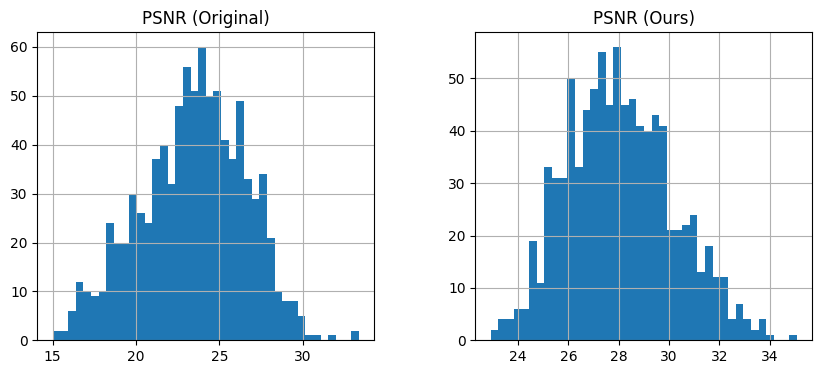

In [41]:
df[["PSNR (Original)", "PSNR (Ours)"]].hist(bins=40, figsize=(10,4))


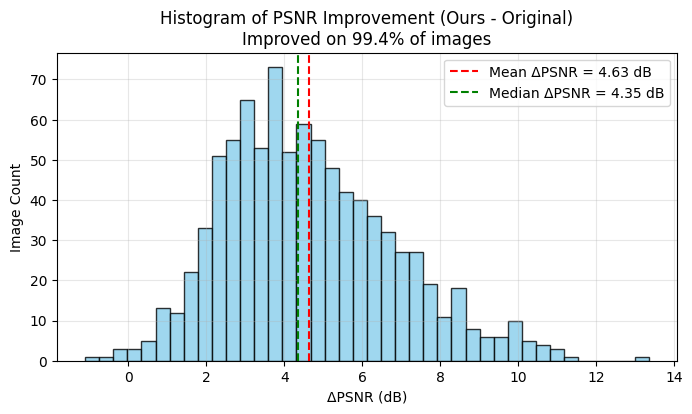

In [42]:
import matplotlib.pyplot as plt

# Compute PSNR difference per image
df["ΔPSNR"] = df["PSNR (Ours)"] - df["PSNR (Original)"]

# Summary stats
mean_diff = df["ΔPSNR"].mean()
median_diff = df["ΔPSNR"].median()
improved = (df["ΔPSNR"] > 0).mean() * 100

# --- Plot ---
plt.figure(figsize=(8,4))
plt.hist(df["ΔPSNR"], bins=40, color="skyblue", edgecolor="k", alpha=0.8)
plt.axvline(mean_diff, color="red", linestyle="--", label=f"Mean ΔPSNR = {mean_diff:.2f} dB")
plt.axvline(median_diff, color="green", linestyle="--", label=f"Median ΔPSNR = {median_diff:.2f} dB")
plt.title(f"Histogram of PSNR Improvement (Ours - Original)\nImproved on {improved:.1f}% of images")
plt.xlabel("ΔPSNR (dB)")
plt.ylabel("Image Count")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


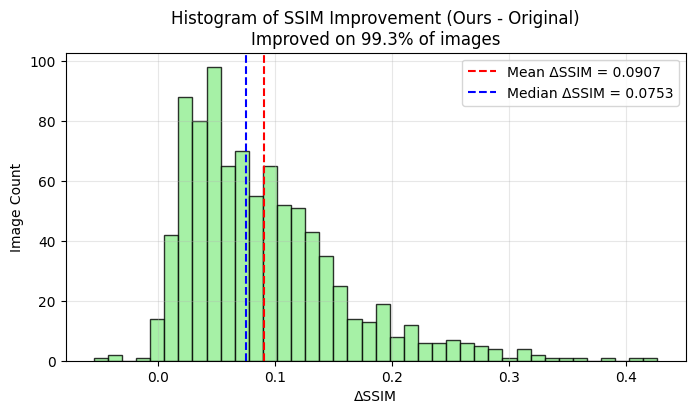

In [43]:
import matplotlib.pyplot as plt

# Compute SSIM difference
df["ΔSSIM"] = df["SSIM (Ours)"] - df["SSIM (Original)"]

# Summary stats
mean_diff = df["ΔSSIM"].mean()
median_diff = df["ΔSSIM"].median()
improved = (df["ΔSSIM"] > 0).mean() * 100

# --- Plot ---
plt.figure(figsize=(8,4))
plt.hist(df["ΔSSIM"], bins=40, color="lightgreen", edgecolor="k", alpha=0.8)
plt.axvline(mean_diff, color="red", linestyle="--", label=f"Mean ΔSSIM = {mean_diff:.4f}")
plt.axvline(median_diff, color="blue", linestyle="--", label=f"Median ΔSSIM = {median_diff:.4f}")
plt.title(f"Histogram of SSIM Improvement (Ours - Original)\nImproved on {improved:.1f}% of images")
plt.xlabel("ΔSSIM")
plt.ylabel("Image Count")
plt.legend()
plt.grid(alpha=0.3)
plt.show()


In [47]:
# Filter for strong improvements
thr_psnr = 10.0
thr_ssim = 0.2

big_gains = df[
    (df["PSNR (Ours)"] - df["PSNR (Original)"] > thr_psnr) &
    (df["SSIM (Ours)"] - df["SSIM (Original)"] > thr_ssim)
].copy()

# Sort by PSNR gain (descending) and show top 10
big_gains["ΔPSNR"] = big_gains["PSNR (Ours)"] - big_gains["PSNR (Original)"]
big_gains["ΔSSIM"] = big_gains["SSIM (Ours)"] - big_gains["SSIM (Original)"]

top10 = big_gains.sort_values("ΔPSNR", ascending=False).head(10)
top10[["filename", "PSNR (Original)", "PSNR (Ours)", "ΔPSNR",
        "SSIM (Original)", "SSIM (Ours)", "ΔSSIM"]]


,filename,PSNR (Original),PSNR (Ours),ΔPSNR,SSIM (Original),SSIM (Ours),ΔSSIM
842,0843_842_heavy_var02,15.760212,29.111994,13.351782,0.507447,0.870988,0.363541
665,0666_665_heavy_var02,20.783822,32.001341,11.217519,0.706099,0.916874,0.210776
840,0841_840_heavy_var02,15.173993,26.251428,11.077435,0.610393,0.831753,0.221360
424,0425_424_heavy_var01,21.512183,32.489734,10.977550,0.489350,0.874802,0.385452
114,0115_114_heavy_var01,18.141494,28.942531,10.801036,0.374338,0.622702,0.248364
763,0764_763_heavy_var05,17.658006,28.212857,10.554850,0.597374,0.855576,0.258202
580,0581_580_heavy_var05,18.475002,28.967452,10.492450,0.654822,0.874206,0.219384
660,0661_660_heavy_var03,15.646113,26.084211,10.438098,0.360372,0.654457,0.294085
586,0587_586_heavy_var02,21.292791,31.443364,10.150573,0.555388,0.810709,0.255321
472,0473_472_heavy_var01,18.913608,29.011402,10.097794,0.610184,0.872776,0.262592


Running PRETRAINED (Prev)…
Restormer params: 26.13M
Loaded 'deraining.pth' | strict=False | missing=0 unexpected=0
Running OURS (epoch10)…
Restormer params: 26.13M
Loaded 'epoch10.pth' | strict=False | missing=0 unexpected=0


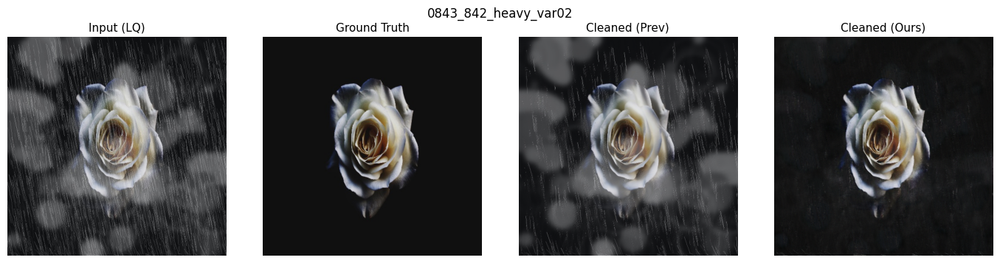

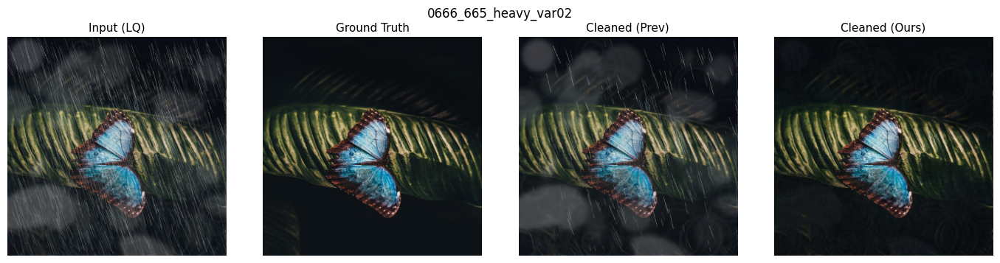

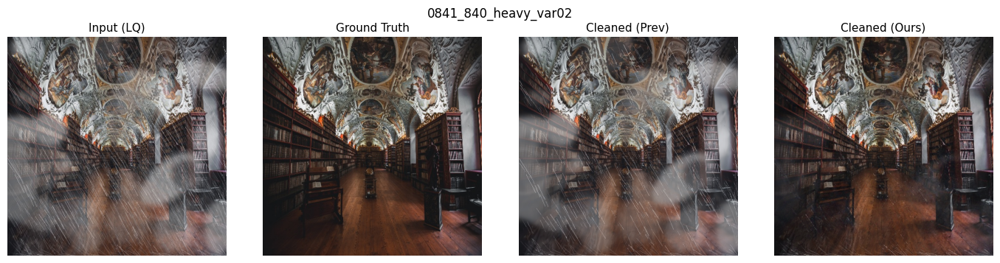

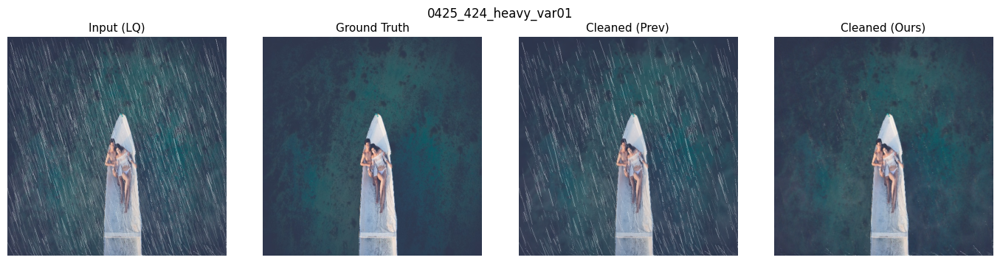

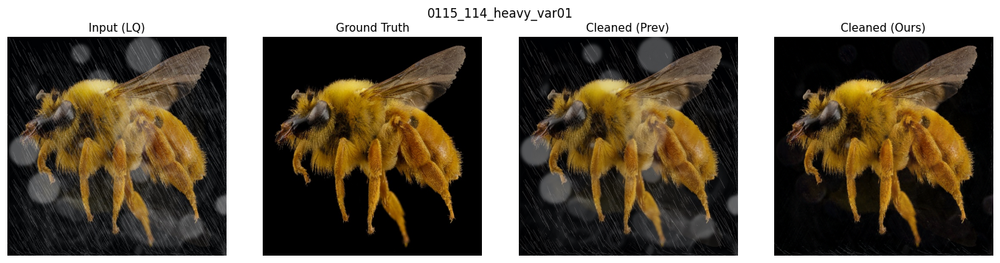

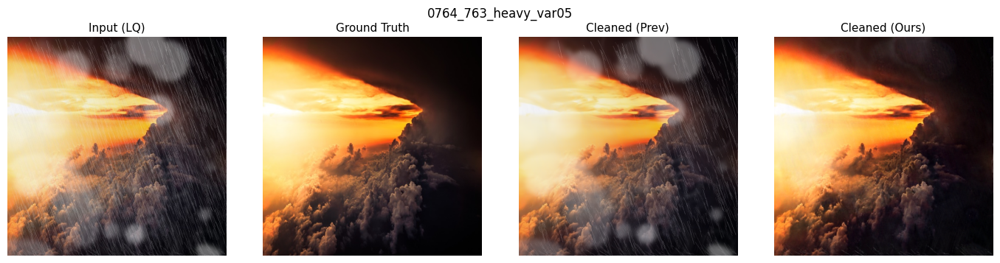

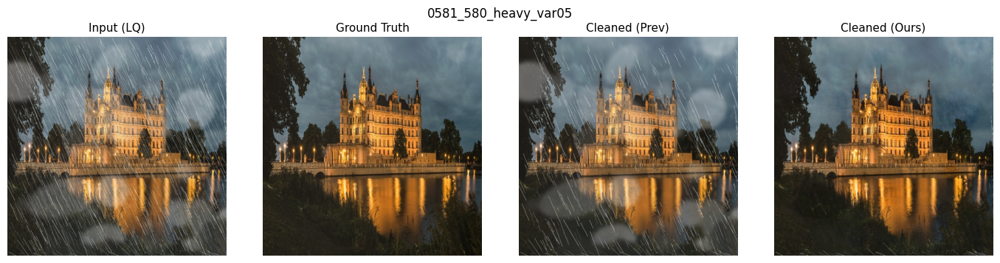

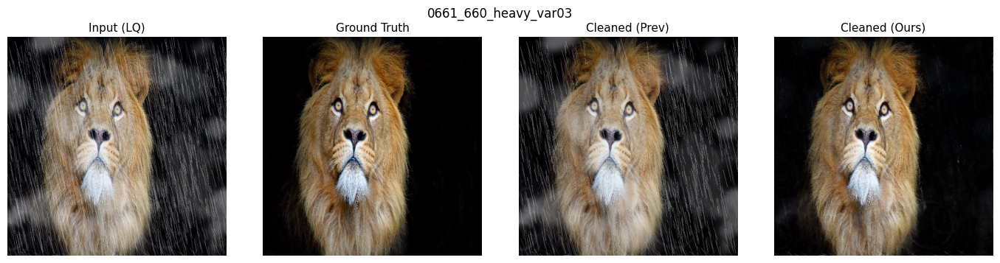

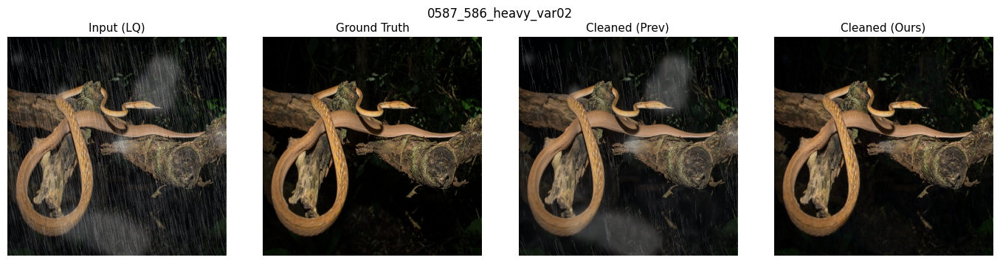

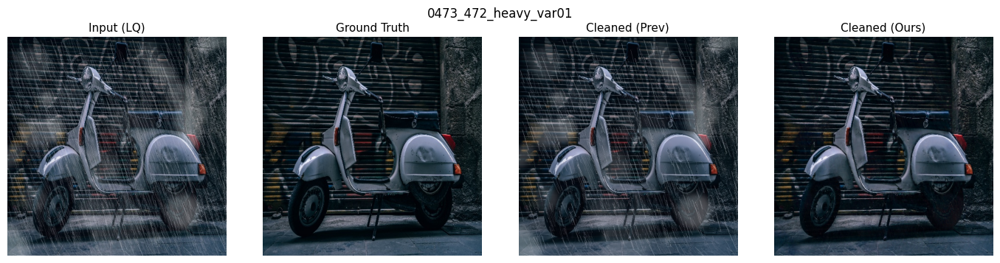

In [65]:
# === Visualize 4-up for a given top-10 list using CACHED tensors ===
import re, gc, torch, numpy as np, matplotlib.pyplot as plt
from pathlib import Path

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# --- paths (must match your earlier cache/training setup) ---
CACHE_DIR = Path("/kaggle/working/restormer_cache_single")
LQ_CACHE_VAL = CACHE_DIR / "lq/val"
GT_CACHE     = CACHE_DIR / "gt_all"

# Base & ours checkpoints (adjust if needed)
PRETRAIN_PATH = "/kaggle/input/deraining/pytorch/default/1/deraining.pth"
FINETUNE_PATH = "/kaggle/working/restormer_exp/checkpoints/epoch10.pth"

# --- helpers ---
def strip_ext(stem: str) -> str:
    # handle names like "0843_842_heavy_var02" or "0843_842_heavy_var02.jpg" or ".pt"
    return re.sub(r"\.(jpg|jpeg|png|pt)$", "", stem, flags=re.IGNORECASE)

def base_from_lq_stem(stem: str) -> str:
    # "000x_00y_heavy_var0i" -> "000x_00y"
    return re.sub(r"_heavy_var0\d$", "", stem)

def ten_to_uint8_hwc(t: torch.Tensor) -> np.ndarray:
    # t: [C,H,W] in [0,1] float
    t = t.detach().clamp(0, 1).cpu()
    return (t.permute(1,2,0).numpy() * 255.0).round().astype(np.uint8)

@torch.no_grad()
def run_model_on_cached_list(ckpt_path: str, names: list[str]) -> dict[str, torch.Tensor]:
    """
    Loads one model, runs it on the cached LQ tensors (val split),
    returns dict[name] -> cleaned tensor [C,H,W] (float on CPU).
    """
    model = build_restormer_for_derain().to(device).eval().to(memory_format=torch.channels_last)
    load_pretrained_into(model, ckpt_path, strict=False)  # uses your robust loader

    outs = {}
    for name in names:
        stem = strip_ext(name)
        lq_pt = LQ_CACHE_VAL / f"{stem}.pt"
        assert lq_pt.exists(), f"Missing LQ cache: {lq_pt}"
        lq = torch.load(str(lq_pt), map_location="cpu").float().unsqueeze(0).to(device)
        lq = lq.to(memory_format=torch.channels_last)

        with torch.amp.autocast('cuda', enabled=True):
            pred = model(lq).float().squeeze(0).clamp(0,1).cpu()  # [C,H,W]
        outs[stem] = pred

        # free per-sample VRAM
        del lq, pred
        torch.cuda.empty_cache()

    del model
    torch.cuda.empty_cache(); gc.collect()
    return outs

def load_cached_pair(stem: str):
    """Return (lq, gt) tensors [C,H,W] from cache as float in [0,1]."""
    lq_pt = LQ_CACHE_VAL / f"{stem}.pt"
    base  = base_from_lq_stem(stem)
    gt_pt = GT_CACHE / f"{base}.pt"
    assert lq_pt.exists(), f"LQ cache missing: {lq_pt}"
    assert gt_pt.exists(), f"GT cache missing: {gt_pt}"
    lq = torch.load(str(lq_pt), map_location="cpu").float()
    gt = torch.load(str(gt_pt), map_location="cpu").float()
    return lq, gt

def show_four_panel(stem: str, prev_img: np.ndarray, ours_img: np.ndarray, lq_img: np.ndarray, gt_img: np.ndarray):
    plt.figure(figsize=(14,3.6))
    panels = [
        ("Input (LQ)", lq_img),
        ("Ground Truth", gt_img),
        ("Cleaned (Prev)", prev_img),
        ("Cleaned (Ours)", ours_img),
    ]
    for i,(title,img) in enumerate(panels, 1):
        ax = plt.subplot(1,4,i)
        ax.imshow(img)
        ax.set_title(title, fontsize=11)
        ax.axis("off")
    plt.suptitle(stem, fontsize=12)
    plt.tight_layout()
    plt.show()

# === 1) Provide your 10 names here (no extension needed) ===
# Example from your message (ensure exactly 10 stems):
names10 = [
    "0843_842_heavy_var02",
    "0666_665_heavy_var02",
    "0841_840_heavy_var02",
    "0425_424_heavy_var01",
    "0115_114_heavy_var01",
    "0764_763_heavy_var05",
    "0581_580_heavy_var05",
    "0661_660_heavy_var03",
    "0587_586_heavy_var02",
    "0473_472_heavy_var01",
]

# === 2) Run each model once on the 10 cached LQ tensors ===
print("Running PRETRAINED (Prev)…")
prev_out = run_model_on_cached_list(PRETRAIN_PATH, names10)
print("Running OURS (epoch10)…")
ours_out = run_model_on_cached_list(FINETUNE_PATH, names10)

# === 3) For each name, load cached LQ/GT and plot the 4 panels ===
for name in names10:
    stem = strip_ext(name)
    # cached LQ/GT
    lq, gt = load_cached_pair(stem)  # [C,H,W] float
    # convert to uint8 HWC for display
    lq_img  = ten_to_uint8_hwc(lq)
    gt_img  = ten_to_uint8_hwc(gt)
    prev_img= ten_to_uint8_hwc(prev_out[stem])
    ours_img= ten_to_uint8_hwc(ours_out[stem])
    # show
    show_four_panel(stem, prev_img, ours_img, lq_img, gt_img)


In [64]:
# --- PATCH: robust loader that accepts str/Path and prints clean name ---
from pathlib import Path
import torch

def load_pretrained_into(model, ckpt_path, strict=False, maploc=None):
    """
    Accepts ckpt_path as str or Path.
    Unwraps common nesting keys and strips 'module.' prefixes.
    Prints missing/unexpected counts safely.
    """
    ckpt_path = Path(ckpt_path)  # <-- handle str or Path
    obj = torch.load(str(ckpt_path), map_location=maploc or ("cuda" if torch.cuda.is_available() else "cpu"))

    # unwrap common containers
    sd = None
    if isinstance(obj, dict):
        for k in ["state_dict", "model", "net", "params", "ema", "params_ema"]:
            if k in obj and isinstance(obj[k], dict):
                sd = obj[k]
                break
        if sd is None:
            sd = obj  # already a plain state_dict
    else:
        sd = obj

    # strip 'module.' if present
    sd = { (k[7:] if k.startswith("module.") else k): v for k, v in sd.items() }

    msg = model.load_state_dict(sd, strict=strict)
    try:
        miss = len(msg.missing_keys); unexp = len(msg.unexpected_keys)
    except AttributeError:
        # older PyTorch returns (missing, unexpected) tuple
        miss, unexp = (len(msg[0]), len(msg[1])) if isinstance(msg, (list, tuple)) else (0, 0)

    print(f"Loaded '{ckpt_path.name}' | strict={strict} | missing={miss} unexpected={unexp}")
    return model
